# 1. LOAD LIBRARY YANG DIBUTUHKAN

In [72]:
# =======================
# Umum & Pengaturan Awal
# =======================
import os
import glob
import warnings
warnings.filterwarnings('ignore')

# =======================
# Data Manipulasi
# =======================
import pandas as pd
import numpy as np

# =======================
# Visualisasi Dasar & Interaktif
# =======================
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio

# =======================
# Visualisasi Geospasial
# =======================
import geopandas as gpd
import contextily as ctx
from mpl_toolkits.mplot3d import Axes3D  # Visualisasi 3D

# =======================
# Tampilan Jupyter Notebook
# =======================
from IPython.display import display
%matplotlib inline
pd.options.display.float_format = '{:.2f}'.format

# =======================
# Preprocessing Data
# =======================
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder
from imblearn.over_sampling import RandomOverSampler  # Penanganan data tidak seimbang

# =======================
# Clustering & Reduksi Dimensi
# =======================
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

# =======================
# Model Klasifikasi
# =======================
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

# =======================
# Evaluasi Model
# =======================
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# =======================
# Simpan & Load Model
# =======================
from joblib import load, dump

# =======================
# Geospasial & Peta
# =======================
import folium
from folium.plugins import MarkerCluster


# 2. MELAKUKAN LOADING DATA YANG DIPERLUKAN

In [73]:
file_paths = {
    "2019": r"D:\aku\SEMESTER 7\PROPOSAL\data laka dicoding\csv dikoding baru\dikoding baru 21 april\2019 csv.csv",
    "2020": r"D:\aku\SEMESTER 7\PROPOSAL\data laka dicoding\csv dikoding baru\dikoding baru 21 april\2020 csv.csv",
    "2021": r"D:\aku\SEMESTER 7\PROPOSAL\data laka dicoding\csv dikoding baru\dikoding baru 21 april\2021 csv.csv",
    "2022": r"D:\aku\SEMESTER 7\PROPOSAL\data laka dicoding\csv dikoding baru\dikoding baru 21 april\2022 csv.csv",
    "2023": r"D:\aku\SEMESTER 7\PROPOSAL\data laka dicoding\csv dikoding baru\dikoding baru 21 april\2023 csv.csv"
}


In [74]:
# Baca semua file CSV ke dalam dataframe
dataframes_corrected = {year: pd.read_csv(path, delimiter=";") for year, path in file_paths.items()}

In [75]:
#==============================
# Tentukan path ke folder file
#==============================

folder_path = r'D:\aku\SEMESTER 7\PROPOSAL\data laka dicoding\csv dikoding baru\dikoding baru 21 april'

#===============================
# Ambil semua file CSV di folder
#===============================
all_files = glob.glob(os.path.join(folder_path, "*.csv"))

# Cek apakah ada file CSV ditemukan
if not all_files:
    print("Tidak ada file CSV ditemukan di folder:", folder_path)
else:
    print(f"{len(all_files)} file CSV ditemukan.")

    # List untuk menyimpan data sementara
    dfs = []

    # Baca semua file dan simpan ke list
    for filename in all_files:
        print(f"Membaca file: {filename}")  # Menambahkan output untuk mengecek file yang dibaca
        df = pd.read_csv(filename)
        dfs.append(df)

    # Gabungkan semua dataframe
    if dfs:  # Pastikan dfs tidak kosong
        df_all = pd.concat(dfs, ignore_index=True)

        # Cek hasilnya
        print(df_all.shape)
        print(df_all.head())

        # Simpan data yang sudah digabung ke file baru
        output_file = r'D:\aku\SEMESTER 7\PROPOSAL\data laka dicoding\csv dikoding baru\output_pisah\gabungan_data.csv'
        df_all.to_csv(output_file, index=False)
        print(f"Data telah disimpan di: {output_file}")
    else:
        print("Tidak ada data untuk digabungkan.")


5 file CSV ditemukan.
Membaca file: D:\aku\SEMESTER 7\PROPOSAL\data laka dicoding\csv dikoding baru\dikoding baru 21 april\2019 csv.csv
Membaca file: D:\aku\SEMESTER 7\PROPOSAL\data laka dicoding\csv dikoding baru\dikoding baru 21 april\2020 csv.csv
Membaca file: D:\aku\SEMESTER 7\PROPOSAL\data laka dicoding\csv dikoding baru\dikoding baru 21 april\2021 csv.csv
Membaca file: D:\aku\SEMESTER 7\PROPOSAL\data laka dicoding\csv dikoding baru\dikoding baru 21 april\2022 csv.csv
Membaca file: D:\aku\SEMESTER 7\PROPOSAL\data laka dicoding\csv dikoding baru\dikoding baru 21 april\2023 csv.csv
(6422, 20)
   Tingkat_Keparahan_Kecelakaan  Tipe_Tabrakan  Klasifikasi_Fungsi_Jalan  \
0                             1             10                         2   
1                             2              4                         3   
2                             1              4                         2   
3                             2              1                         4   
4                

In [76]:
df_all.head()

,Tingkat_Keparahan_Kecelakaan,Tipe_Tabrakan,Klasifikasi_Fungsi_Jalan,Kelas_Jalan,Status_Administratif_Jalan,Jenis_Kawasan,Jam_Kejadian,Bentuk_Jalan,Jenis_Gangguan_Jalan,Jumlah_Sepeda_Motor,Jumlah_Mobil_Penumpang,Jumlah_Mobil_Bus,Jumlah_Mobil_Barang,_Kendaraan_Khusus,Jumlah_tidak_bermotor,Meninggal_Dunia,Luka_Berat,Luka_Ringan,Tidak_Luka,Kondisi_Cuaca
0,1,10,2,2,2,1,5,1,11,1,2,0,0,0,0,0,0,0,0,3
1,2,4,3,5,3,1,4,1,11,2,0,0,0,0,0,2,0,3,2,1
2,1,4,2,2,3,1,5,1,11,1,1,0,0,0,0,0,0,2,0,1
3,2,1,4,5,3,1,6,1,11,1,0,0,0,0,0,1,0,0,1,1
4,2,4,3,4,3,1,7,1,2,1,0,0,0,0,1,0,0,1,0,1


# 3. PRE-PROCESSING DATA


✅ Data tahun 2019 setelah penanganan missing values: (1279, 1) (baris, kolom)
🎉 Tidak ada missing values di tahun 2019.


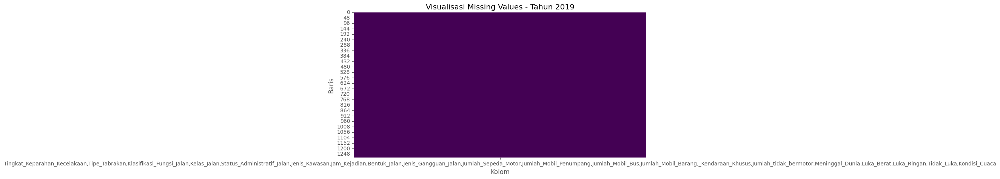


✅ Data tahun 2020 setelah penanganan missing values: (994, 1) (baris, kolom)
🎉 Tidak ada missing values di tahun 2020.


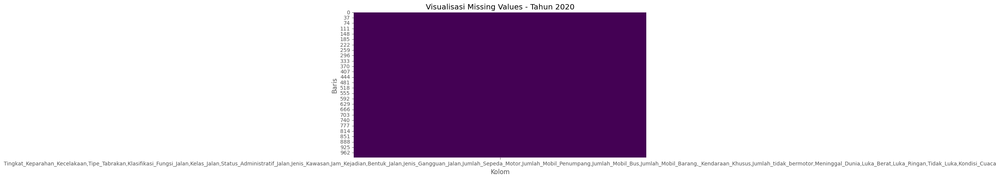


✅ Data tahun 2021 setelah penanganan missing values: (1135, 1) (baris, kolom)
🎉 Tidak ada missing values di tahun 2021.


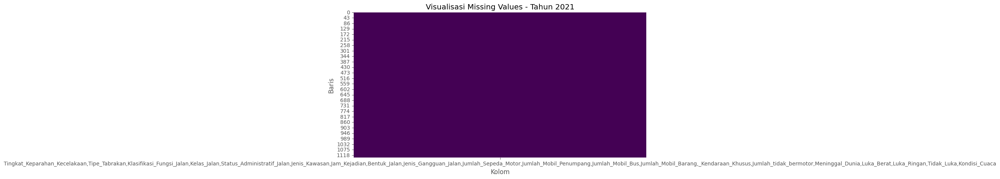


✅ Data tahun 2022 setelah penanganan missing values: (1527, 1) (baris, kolom)
🎉 Tidak ada missing values di tahun 2022.


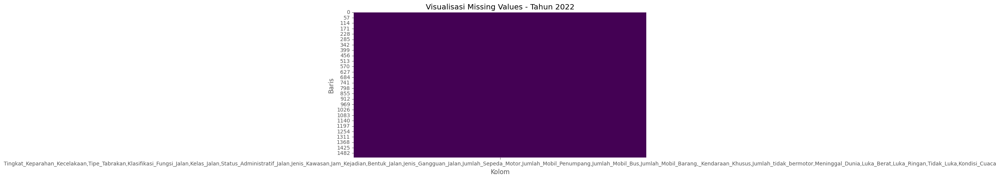


✅ Data tahun 2023 setelah penanganan missing values: (1487, 1) (baris, kolom)
🎉 Tidak ada missing values di tahun 2023.


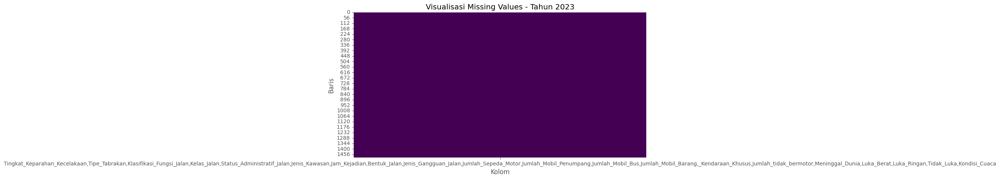

In [77]:
# CEK MISSING VALUES DAN ISI DATA YANG KOSONG
# Pilihan strategi: 'drop' untuk hapus, 'mean' atau 'median' untuk isi numerik
strategy = 'mean'  # Ganti jadi 'drop', 'median', atau lainnya sesuai kebutuhan

for year in dataframes_corrected:
    df = dataframes_corrected[year]

    # Tangani missing values
    if strategy == 'drop':
        df_cleaned = df.dropna()
    else:
        # Isi hanya kolom numerik
        df_cleaned = df.copy()
        numeric_cols = df_cleaned.select_dtypes(include=['float64', 'int64']).columns
        for col in numeric_cols:
            if strategy == 'mean':
                df_cleaned[col].fillna(df_cleaned[col].mean(), inplace=True)
            elif strategy == 'median':
                df_cleaned[col].fillna(df_cleaned[col].median(), inplace=True)

        # (Opsional) Kolom kategorikal bisa diisi dengan modus jika ada
        categorical_cols = df_cleaned.select_dtypes(include=['object']).columns
        for col in categorical_cols:
            df_cleaned[col].fillna(df_cleaned[col].mode()[0], inplace=True)

    # Simpan kembali ke dict
    dataframes_corrected[year] = df_cleaned

    # Cetak ringkasan
    print(f"\n✅ Data tahun {year} setelah penanganan missing values: {df_cleaned.shape} (baris, kolom)")

    # Tampilkan kolom yang masih punya missing (kalau ada)
    missing = df_cleaned.isnull().sum()
    if missing.sum() > 0:
        print(f"❗ Masih ada missing values di tahun {year}:")
        print(missing[missing > 0])
    else:
        print(f"🎉 Tidak ada missing values di tahun {year}.")

    # Visualisasi heatmap missing value
    plt.figure(figsize=(10, 5))
    sns.heatmap(df_cleaned.isnull(), cbar=False, cmap="viridis")
    plt.title(f'Visualisasi Missing Values - Tahun {year}')
    plt.xlabel("Kolom")
    plt.ylabel("Baris")
    plt.show()


In [78]:
# Tentukan path ke folder file
folder_path = 'D:/aku/SEMESTER 7/PROPOSAL/data laka dicoding/csv dikoding baru/output_pisah'

# Ambil semua file CSV di folder
all_files = glob.glob(os.path.join(folder_path, "*.csv"))

# List untuk menyimpan data sementara
dfs = []

# Baca semua file CSV dan simpan ke dalam list (menggunakan pemisah koma atau titik koma)
for filename in all_files:
    try:
        # Coba baca file dengan pemisah koma
        df = pd.read_csv(filename, sep=",")  # Atau ganti ',' dengan ';' jika pemisahnya titik koma
        dfs.append(df)
    except Exception as e:
        print(f"Error membaca file {filename}: {e}")

# Gabungkan semua dataframe
df_all = pd.concat(dfs, ignore_index=True)

# Tampilkan nama kolom untuk memastikan kolom terbaca dengan benar
print("Nama kolom yang terbaca:", df_all.columns)

# Jika kolom terbaca dengan benar, lanjutkan dengan encoding
categorical_columns = ["Tingkat_Keparahan_Kecelakaan", "Tipe_Tabrakan", "Klasifikasi_Fungsi_Jalan", "Kelas_Jalan",
                       "Status_Administratif_Jalan", "Jenis_Kawasan", "Jam_Kejadian", "Bentuk_Jalan",
                       "Jenis_Gangguan_Jalan", "Jumlah_Sepeda_Motor", "Jumlah_Mobil_Penumpang",
                       "Jumlah_Mobil_Bus", "Jumlah_Mobil_Barang", "_Kendaraan_Khusus", "Jumlah_tidak_bermotor",
                       "Meninggal_Dunia", "Luka_Berat", "Luka_Ringan", "Tidak_Luka", "Kondisi_Cuaca"]

# Import LabelEncoder
label_encoders = {}
for col in categorical_columns:
    if col in df_all.columns:  # Pastikan kolom ada dalam data
        label_encoders[col] = LabelEncoder()
        df_all[col] = label_encoders[col].fit_transform(df_all[col].astype(str)) + 1  # Tambahkan 1 setelah encoding

# Cek hasil setelah encoding
print(df_all.head())


Nama kolom yang terbaca: Index(['Tingkat_Keparahan_Kecelakaan', 'Tipe_Tabrakan',
       'Klasifikasi_Fungsi_Jalan', 'Kelas_Jalan', 'Status_Administratif_Jalan',
       'Jenis_Kawasan', 'Jam_Kejadian', 'Bentuk_Jalan', 'Jenis_Gangguan_Jalan',
       'Jumlah_Sepeda_Motor', 'Jumlah_Mobil_Penumpang', 'Jumlah_Mobil_Bus',
       'Jumlah_Mobil_Barang', '_Kendaraan_Khusus', 'Jumlah_tidak_bermotor',
       'Meninggal_Dunia', 'Luka_Berat', 'Luka_Ringan', 'Tidak_Luka',
       'Kondisi_Cuaca'],
      dtype='object')
   Tingkat_Keparahan_Kecelakaan  Tipe_Tabrakan  Klasifikasi_Fungsi_Jalan  \
0                             1              2                         2   
1                             2              5                         3   
2                             1              5                         2   
3                             2              1                         4   
4                             2              5                         3   

   Kelas_Jalan  Status_Administrat

In [79]:
# Proceed to Exploratory Data Analysis (EDA)
df_all.describe()

,Tingkat_Keparahan_Kecelakaan,Tipe_Tabrakan,Klasifikasi_Fungsi_Jalan,Kelas_Jalan,Status_Administratif_Jalan,Jenis_Kawasan,Jam_Kejadian,Bentuk_Jalan,Jenis_Gangguan_Jalan,Jumlah_Sepeda_Motor,Jumlah_Mobil_Penumpang,Jumlah_Mobil_Bus,Jumlah_Mobil_Barang,_Kendaraan_Khusus,Jumlah_tidak_bermotor,Meninggal_Dunia,Luka_Berat,Luka_Ringan,Tidak_Luka,Kondisi_Cuaca
count,6422.00,6422.00,6422.00,6422.00,6422.00,6422.00,6422.00,6422.00,6422.00,6422.00,6422.00,6422.00,6422.00,6422.00,6422.00,6422.00,6422.00,6422.00,6422.00,6422.00
mean,1.93,3.79,2.76,3.25,2.99,1.15,4.65,1.29,3.92,2.41,1.11,1.01,1.08,1.00,1.08,1.08,1.00,2.45,1.67,1.04
std,0.26,1.83,0.69,1.04,0.91,0.46,1.87,0.86,2.40,0.55,0.32,0.10,0.28,0.01,0.28,0.28,0.05,0.99,0.56,0.33
min,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
25%,2.00,3.00,3.00,3.00,3.00,1.00,3.00,1.00,3.00,2.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,2.00,1.00,1.00
50%,2.00,4.00,3.00,4.00,3.00,1.00,4.00,1.00,3.00,2.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,2.00,2.00,1.00
75%,2.00,5.00,3.00,4.00,3.00,1.00,6.00,1.00,3.00,3.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,2.00,2.00,1.00
max,3.00,9.00,4.00,4.00,5.00,5.00,9.00,8.00,11.00,5.00,4.00,2.00,3.00,2.00,3.00,4.00,3.00,8.00,4.00,7.00


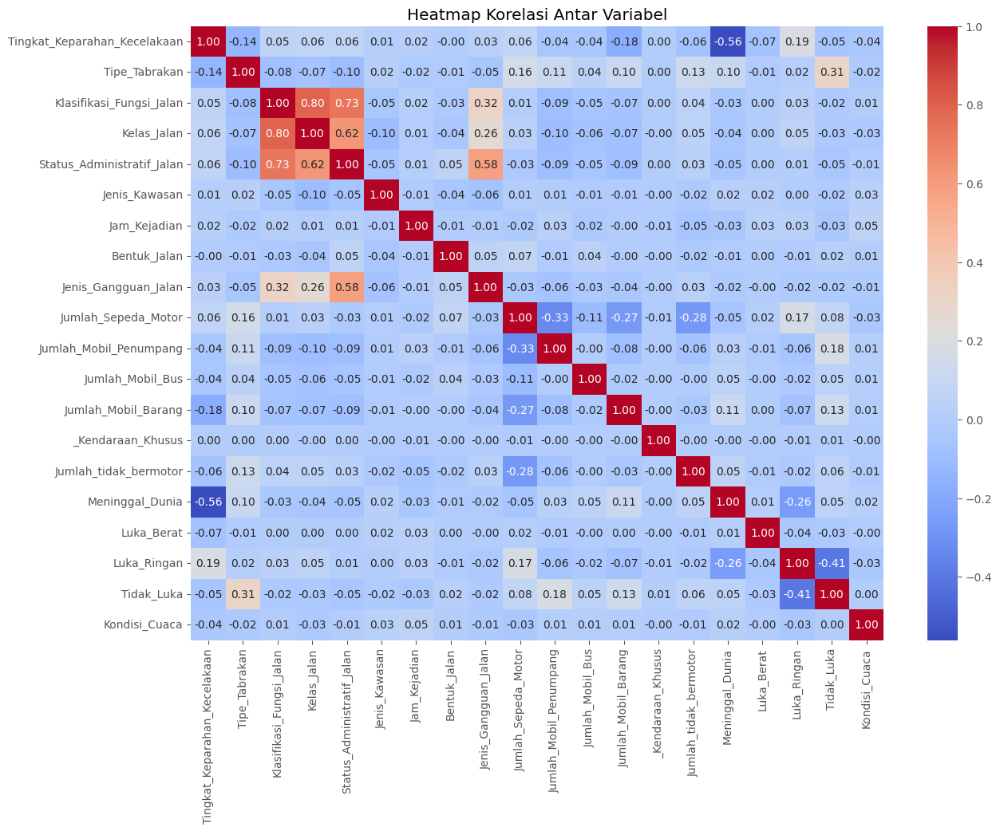

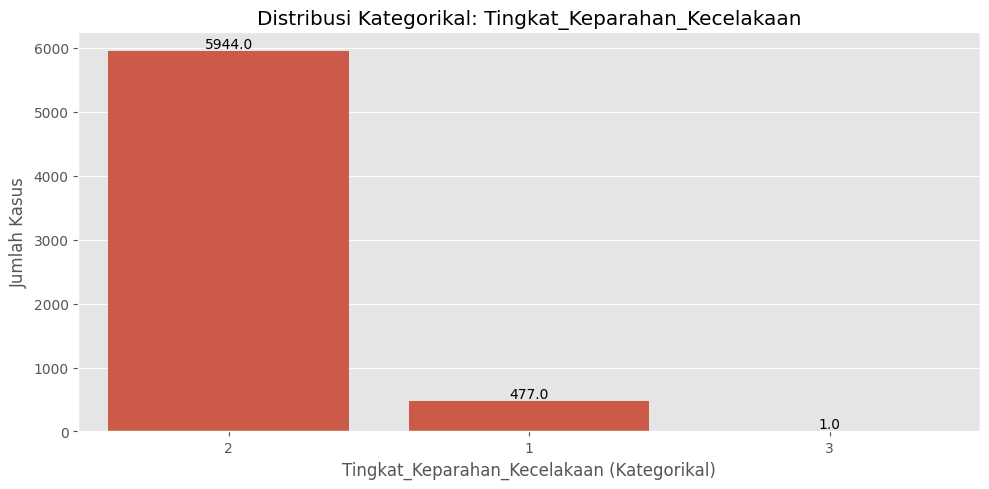

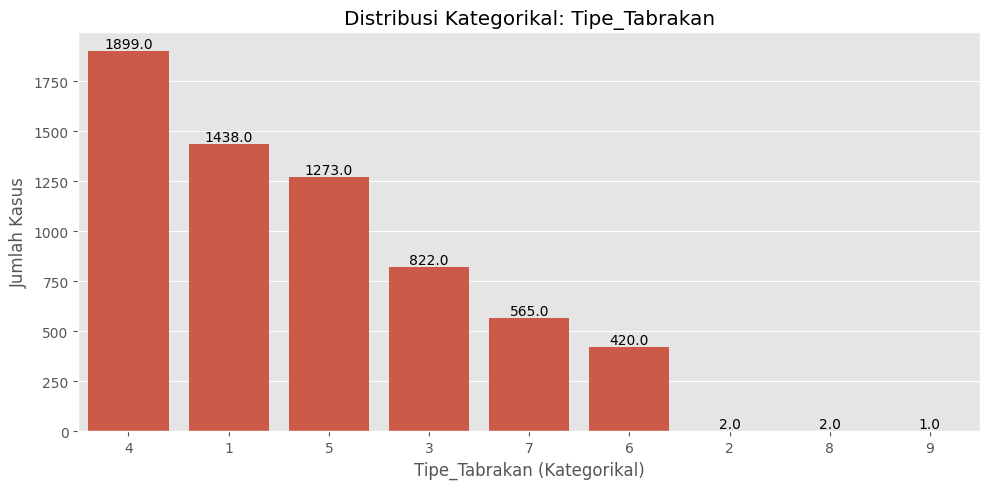

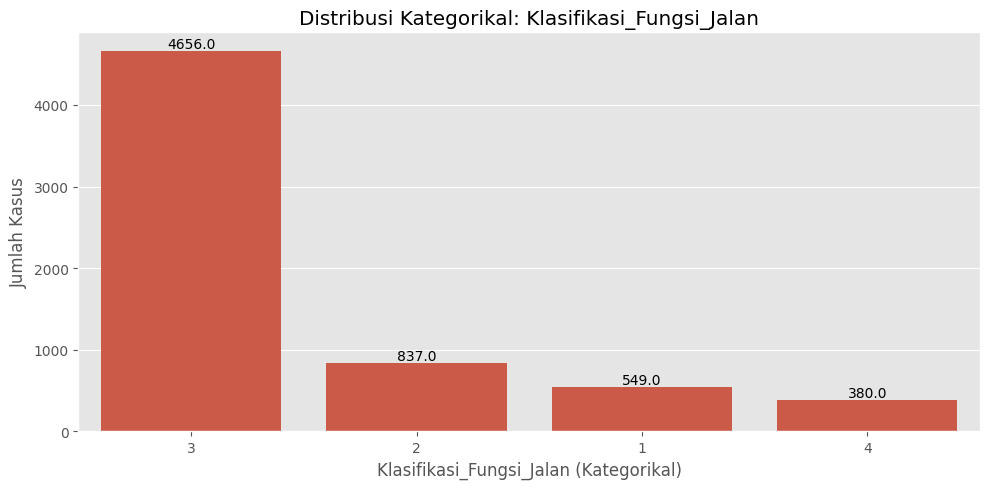

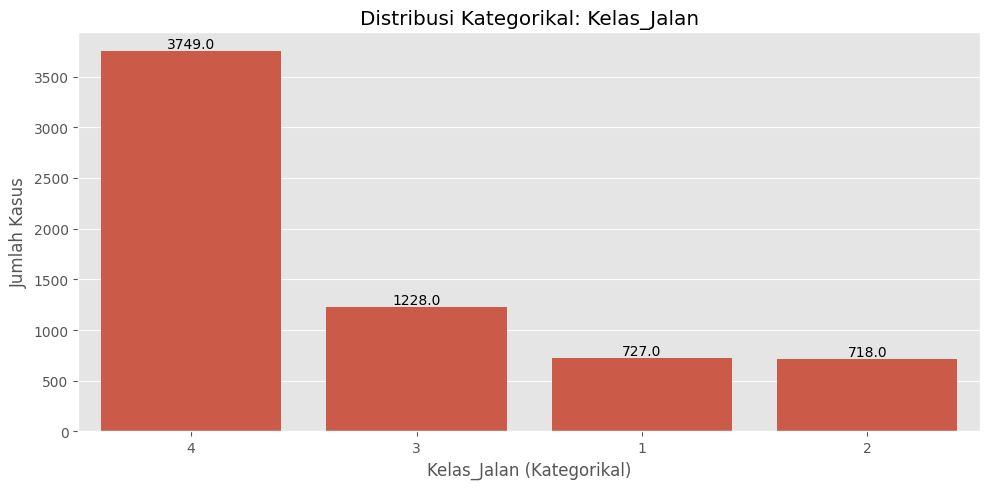

...

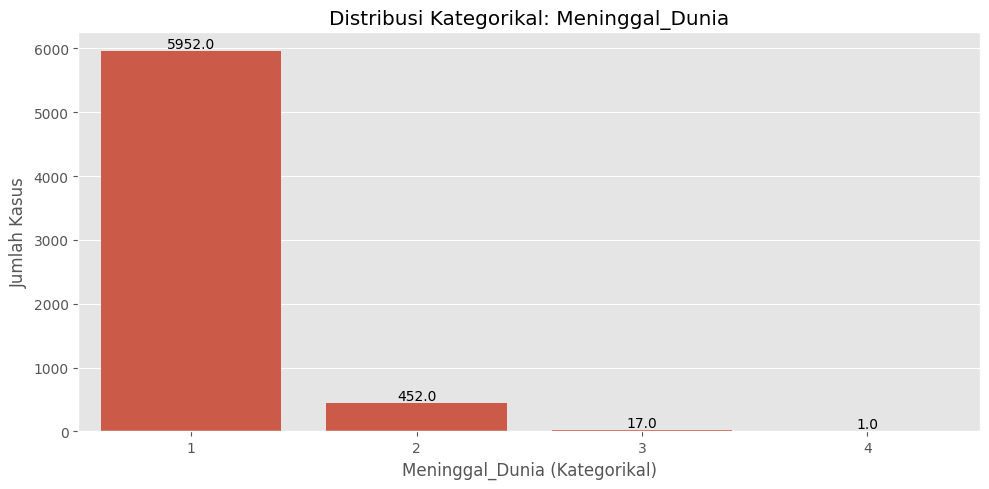

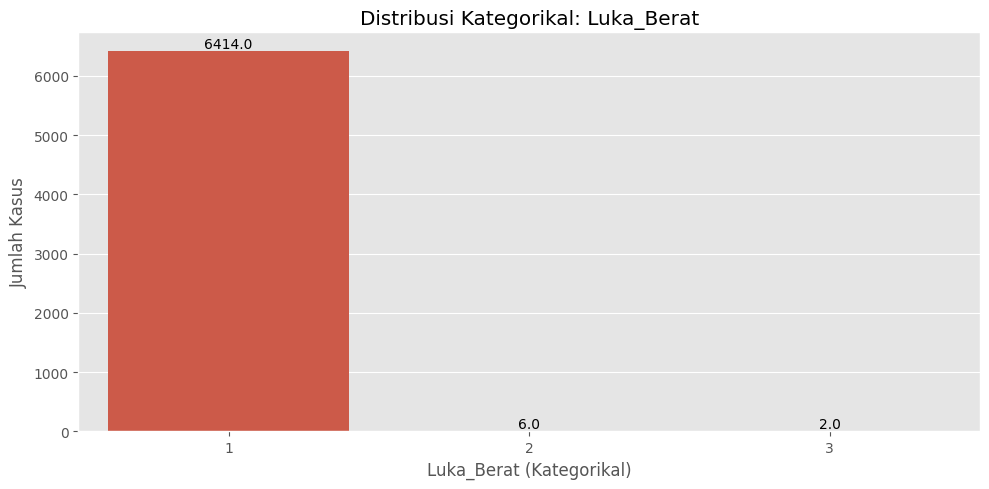

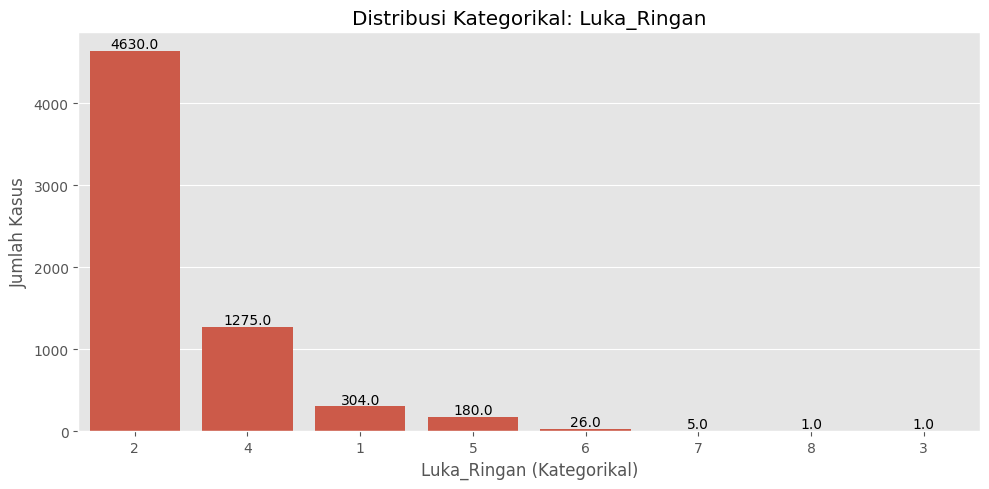

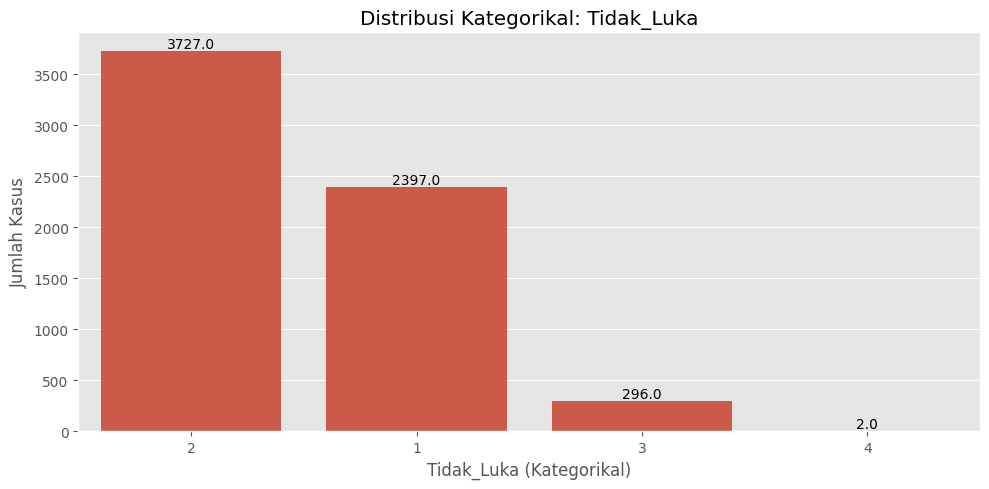

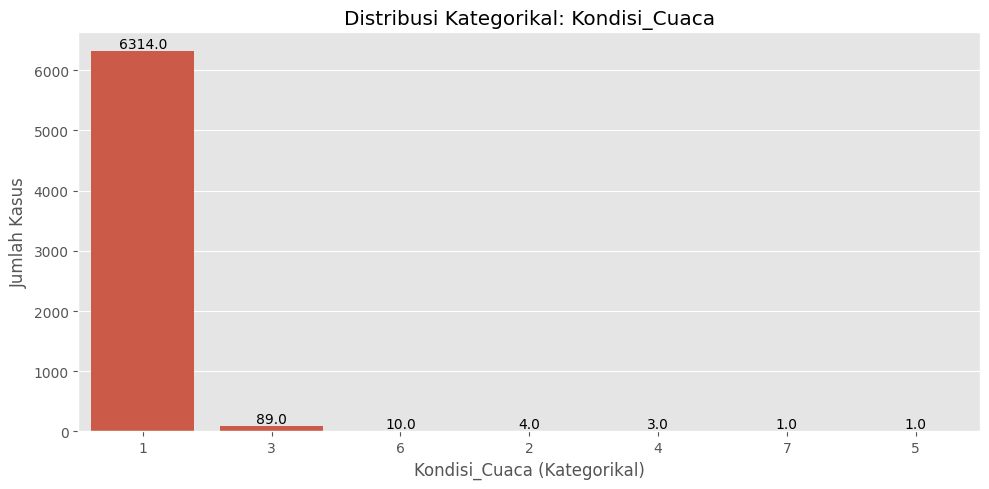

In [80]:
# ANALISIS STATISTIK DASAR
# Set style
plt.style.use("ggplot")

# 1. Heatmap Korelasi
plt.figure(figsize=(14, 10))
sns.heatmap(df_all.corr(numeric_only=True), annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Heatmap Korelasi Antar Variabel")
plt.show()

# 2. Distribusi Setiap Fitur + Label Nilai (Nominal)
threshold_kategori = 20  # fitur dengan nilai unik <= 20 dianggap kategorikal

for col in df_all.columns:
    plt.figure(figsize=(10, 5))

    if df_all[col].nunique() <= threshold_kategori:
        # Kategorikal
        ax = sns.countplot(x=df_all[col], order=df_all[col].value_counts().index)
        plt.xlabel(f'{col} (Kategorikal)')
        plt.ylabel('Jumlah Kasus')
        plt.title(f'Distribusi Kategorikal: {col}')

        # Tambahkan label nominal di atas bar
        for p in ax.patches:
            ax.annotate(f'{p.get_height()}',
                        (p.get_x() + p.get_width() / 2., p.get_height()),
                        ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                        textcoords='offset points')

    else:
        # Numerikal
        ax = sns.histplot(df_all[col], kde=True)
        plt.xlabel(f'{col} (Numerikal)')
        plt.ylabel('Jumlah Kasus')
        plt.title(f'Distribusi Numerikal: {col}')

    plt.tight_layout()
    plt.show()


# 4. MELAKUKAN RESAMPLING PADA DATA

In [81]:
#4. MELAKUKAN PROSES RESAMPLING UNTUK MENANGANI KETIDAKSEIMBANGAN DATA

# Langkah 1: Pisahkan fitur (X) dan target (y)
X = df_all.drop('Tingkat_Keparahan_Kecelakaan', axis=1)
y = df_all['Tingkat_Keparahan_Kecelakaan']

# Langkah 2: Cek distribusi awal
print("Distribusi awal:")
print(y.value_counts())

# Langkah 3: Inisialisasi RandomOverSampler
ros = RandomOverSampler(random_state=42)

# Langkah 4: Fit dan Resample
X_resampled, y_resampled = ros.fit_resample(X, y)

# Langkah 5: Cek distribusi setelah resampling
print("\nDistribusi setelah RandomOverSampler:")
print(y_resampled.value_counts())

# Opsional: Gabungkan kembali X dan y yang telah di-resample ke DataFrame baru
df_resampled = pd.concat([
    pd.DataFrame(X_resampled, columns=X.columns),
    pd.DataFrame(y_resampled, columns=['Tingkat_Keparahan_Kecelakaan'])
], axis=1)


Distribusi awal:
Tingkat_Keparahan_Kecelakaan
2    5944
1     477
3       1
Name: count, dtype: int64

Distribusi setelah RandomOverSampler:
Tingkat_Keparahan_Kecelakaan
1    5944
2    5944
3    5944
Name: count, dtype: int64


# 5. MEMBANGUN MODEL RANDOM FOREST


🔹 Akurasi Model: 0.9756

🔹 Laporan Klasifikasi:


,precision,recall,f1-score,support
1,0.95,0.98,0.97,1226.00
2,0.98,0.94,0.96,1177.00
3,1.00,1.00,1.00,1164.00
accuracy,0.98,0.98,0.98,0.98
macro avg,0.98,0.98,0.98,3567.00
weighted avg,0.98,0.98,0.98,3567.00


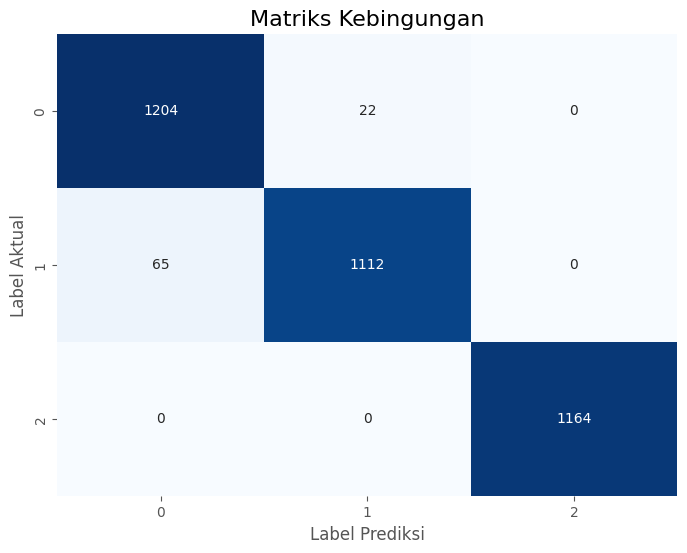


🔹 Tiga Fitur Paling Berpengaruh:
['Tidak_Luka', 'Tipe_Tabrakan', 'Meninggal_Dunia']


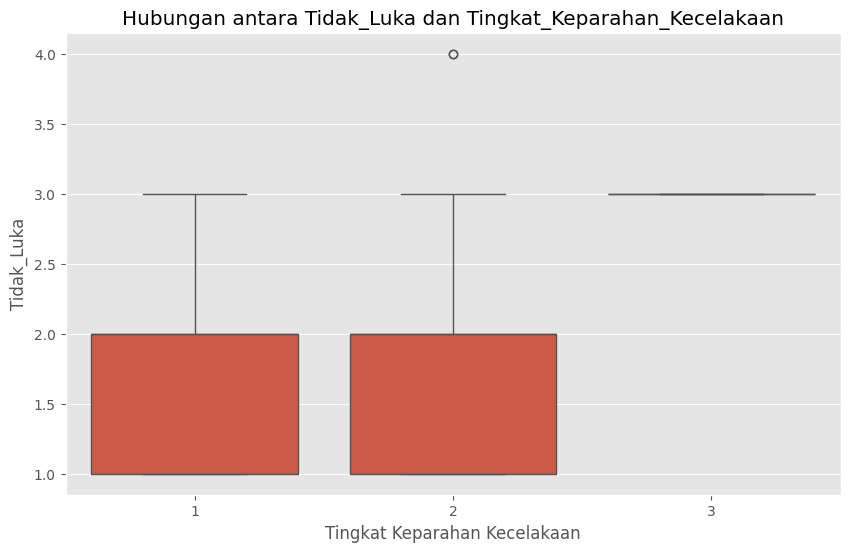

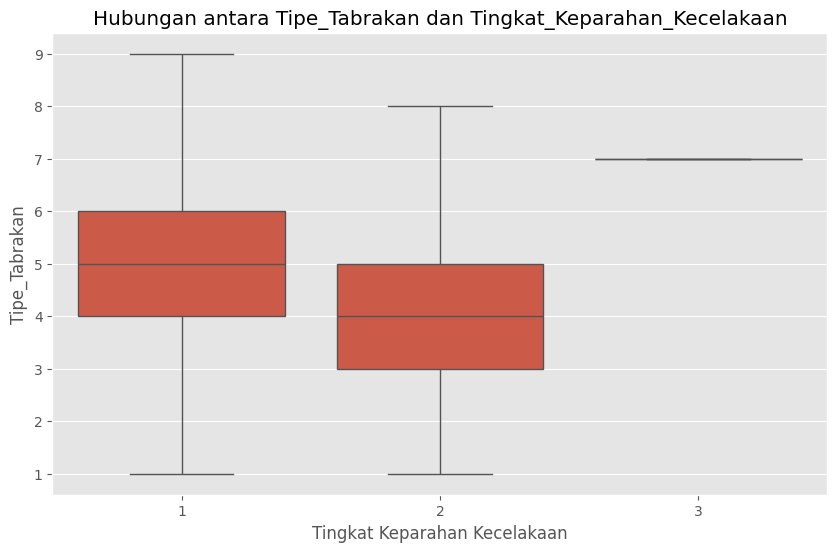

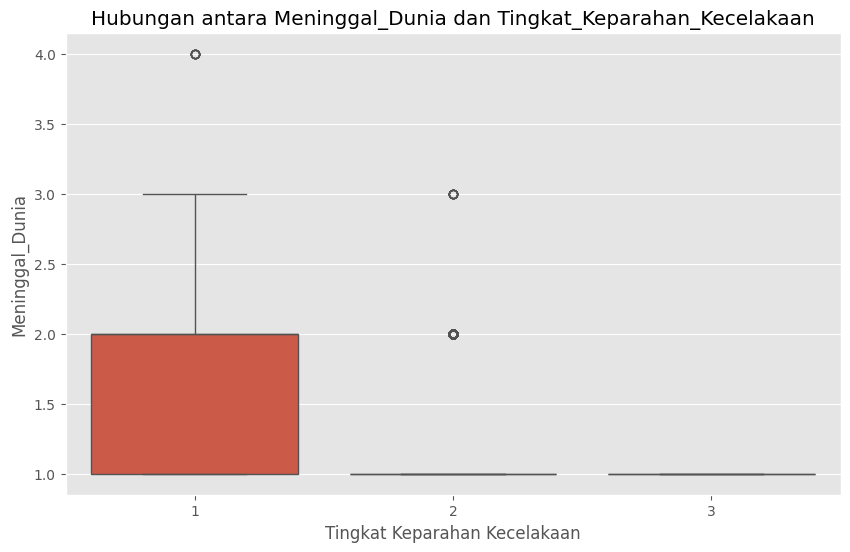

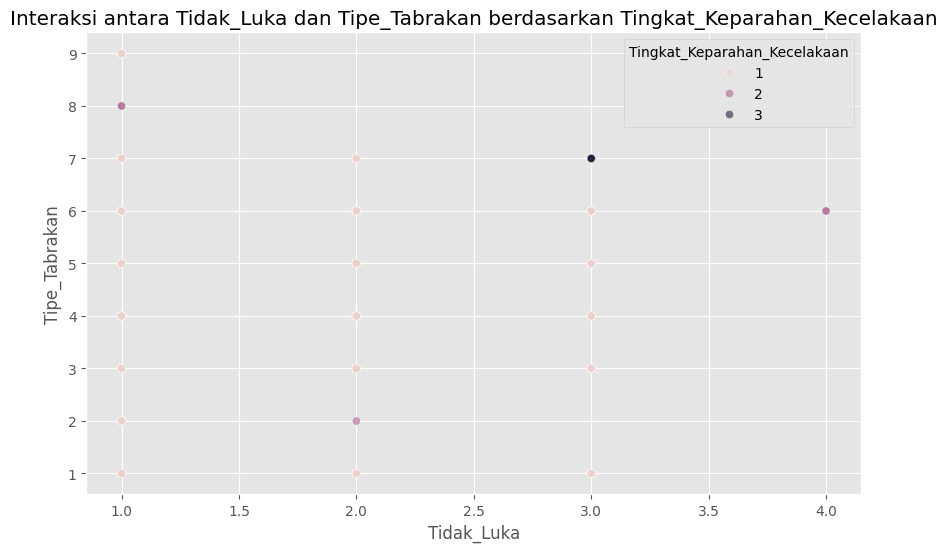

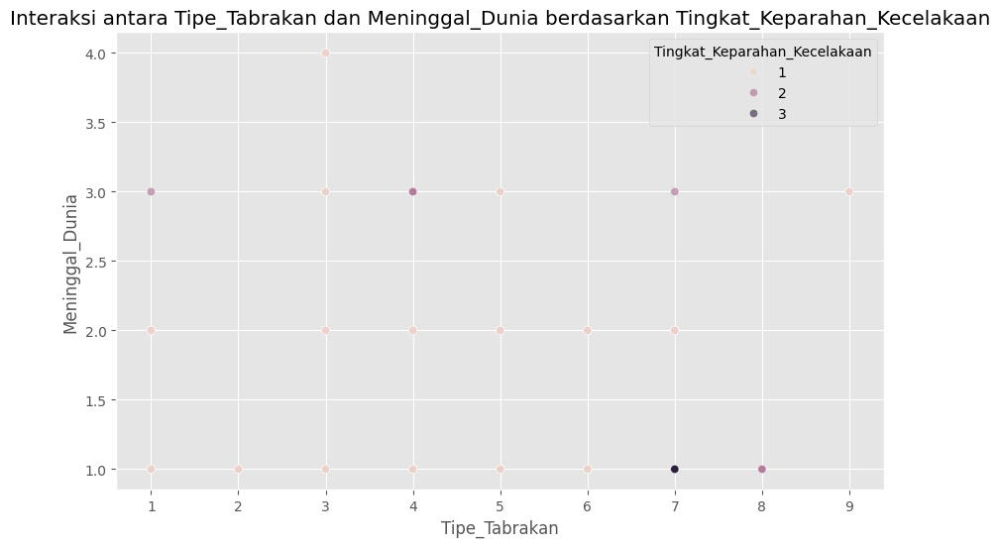

In [82]:
# 1. Definisi Fitur dan Target
fitur = [
    "Tipe_Tabrakan", "Klasifikasi_Fungsi_Jalan", "Kelas_Jalan", "Status_Administratif_Jalan",
    "Jenis_Kawasan", "Jam_Kejadian", "Bentuk_Jalan", "Jenis_Gangguan_Jalan", "Jumlah_Sepeda_Motor", 
    "Jumlah_Mobil_Penumpang", "Jumlah_Mobil_Bus", "Jumlah_Mobil_Barang", "_Kendaraan_Khusus", 
    "Jumlah_tidak_bermotor", "Meninggal_Dunia", "Luka_Berat", "Luka_Ringan", "Tidak_Luka", "Kondisi_Cuaca"
]
target = "Tingkat_Keparahan_Kecelakaan"

# 2. Split Data Latih & Uji
X = df_resampled[fitur]
y = df_resampled[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 3. Melatih Model Random Forest
model_rf = RandomForestClassifier(n_estimators=100, random_state=42)
model_rf.fit(X_train, y_train)

# 4. Prediksi dan Evaluasi Model
y_pred = model_rf.predict(X_test)
akurasi = accuracy_score(y_test, y_pred)
laporan_klasifikasi = classification_report(y_test, y_pred, output_dict=True)
matriks_kebingungannya = confusion_matrix(y_test, y_pred)

# 5. Tampilkan Hasil Evaluasi
print(f"\n🔹 Akurasi Model: {akurasi:.4f}")
print("\n🔹 Laporan Klasifikasi:")
df_laporan = pd.DataFrame(laporan_klasifikasi).transpose()
display(df_laporan.style.background_gradient(cmap='Blues').format(precision=2))

plt.figure(figsize=(8,6))
sns.heatmap(matriks_kebingungannya, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Matriks Kebingungan', fontsize=16)
plt.xlabel('Label Prediksi')
plt.ylabel('Label Aktual')
plt.show()

# 6. Analisis Pentingnya Fitur
pentingnya_fitur = model_rf.feature_importances_
df_pentingnya_fitur = pd.DataFrame({
    'Fitur': fitur,
    'Pentingnya': pentingnya_fitur
}).sort_values(by="Pentingnya", ascending=False)

# 7. Tampilkan 3 Fitur Teratas
fitur_teratas = df_pentingnya_fitur.head(3)["Fitur"].tolist()
print("\n🔹 Tiga Fitur Paling Berpengaruh:")
print(fitur_teratas)

# 8. Visualisasi Hubungan antara Fitur Penting dan Target
for fitur_top in fitur_teratas:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=df_resampled[target], y=df_resampled[fitur_top])
    plt.title(f"Hubungan antara {fitur_top} dan {target}")
    plt.xlabel("Tingkat Keparahan Kecelakaan")
    plt.ylabel(fitur_top)
    plt.show()

# 9. Visualisasi Interaksi Antar Fitur Penting
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=df_resampled[fitur_teratas[0]], y=df_resampled[fitur_teratas[1]],
    hue=df_resampled[target], alpha=0.6
)
plt.title(f"Interaksi antara {fitur_teratas[0]} dan {fitur_teratas[1]} berdasarkan {target}")
plt.xlabel(fitur_teratas[0])
plt.ylabel(fitur_teratas[1])
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=df_resampled[fitur_teratas[1]], y=df_resampled[fitur_teratas[2]],
    hue=df_resampled[target], alpha=0.6
)
plt.title(f"Interaksi antara {fitur_teratas[1]} dan {fitur_teratas[2]} berdasarkan {target}")
plt.xlabel(fitur_teratas[1])
plt.ylabel(fitur_teratas[2])
plt.show()


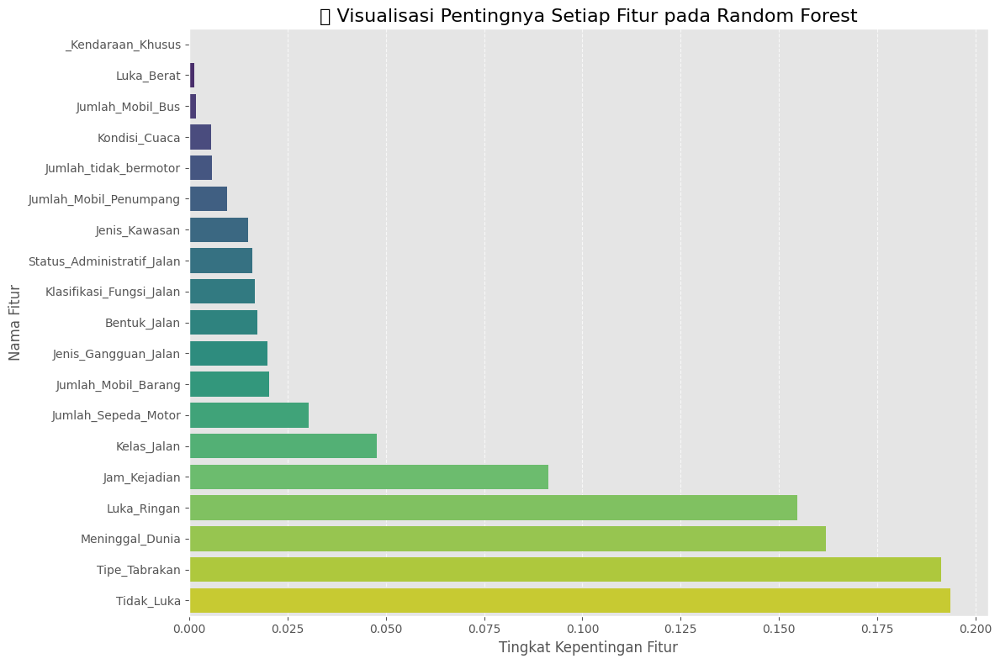

In [83]:
# Hitung pentingnya fitur dari model Random Forest
pentingnya_fitur = model_rf.feature_importances_
df_pentingnya_fitur = pd.DataFrame({
    'Fitur': fitur,
    'Pentingnya': pentingnya_fitur
}).sort_values(by='Pentingnya', ascending=True)  # ascending supaya bar dari bawah ke atas

# Visualisasi: Bar Chart Horizontal Berwarna
plt.figure(figsize=(12, 8))
colors = sns.color_palette("viridis", len(df_pentingnya_fitur))  # palet warna

sns.barplot(
    x='Pentingnya',
    y='Fitur',
    data=df_pentingnya_fitur,
    palette=colors
)

plt.title("🔍 Visualisasi Pentingnya Setiap Fitur pada Random Forest", fontsize=16)
plt.xlabel("Tingkat Kepentingan Fitur")
plt.ylabel("Nama Fitur")
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [84]:
# Misalkan model_rf adalah model RandomForestClassifier yang sudah dilatih
dump(model_rf, 'random_forest_model.joblib')  # Menyimpan model ke file .joblib


['random_forest_model.joblib']

In [85]:
# Memuat model
model_rf = load('random_forest_model.joblib')

# Input yang didesain untuk memprediksi
input_data = {
    "Tipe_Tabrakan":9,                 
    "Klasifikasi_Fungsi_Jalan": 2,      
    "Kelas_Jalan": 2,                   
    "Status_Administratif_Jalan": 3,
    "Jenis_Kawasan": 3,                 
    "Jam_Kejadian": 7,                  
    "Bentuk_Jalan": 3,                  
    "Jenis_Gangguan_Jalan": 2,          
    "Jumlah_Sepeda_Motor": 1,
    "Jumlah_Mobil_Penumpang": 0,
    "Jumlah_Mobil_Bus": 0,
    "Jumlah_Mobil_Barang": 0,
    "_Kendaraan_Khusus": 0,
    "Jumlah_tidak_bermotor": 1,
    "Luka_Berat": 0,
    "Luka_Ringan": 1,
    "Tidak_Luka": 1,
    "Kondisi_Cuaca": 3,                 
    "Meninggal_Dunia": 0                
}

# Konversi ke DataFrame dan sesuaikan urutan fitur
input_df = pd.DataFrame([input_data])
input_df = input_df[model_rf.feature_names_in_]

# Prediksi
hasil_prediksi = model_rf.predict(input_df)

# Interpretasi hasil
if hasil_prediksi[0] == 1:
    print("Hasil Prediksi: Tingkat Keparahan = Berat")
elif hasil_prediksi[0] == 2:
    print("Hasil Prediksi: Tingkat Keparahan = Sedang")
else:
    print("Hasil Prediksi: Tingkat Keparahan = Ringan")


Hasil Prediksi: Tingkat Keparahan = Berat


In [86]:
proba = model_rf.predict_proba(input_df)
print("Probabilitas Prediksi (1=Berat, 2=Sedang, 3=Ringan):", proba)


Probabilitas Prediksi (1=Berat, 2=Sedang, 3=Ringan): [[0.51 0.36 0.13]]


# 6. MEMBANGUN MODEL XGBOOST


🔹 Akurasi Model XGBoost: 0.9636

🔹 Laporan Klasifikasi:


,precision,recall,f1-score,support
1,0.94,0.96,0.95,1226.00
2,0.95,0.93,0.94,1177.00
3,1.00,1.00,1.00,1164.00
accuracy,0.96,0.96,0.96,0.96
macro avg,0.96,0.96,0.96,3567.00
weighted avg,0.96,0.96,0.96,3567.00


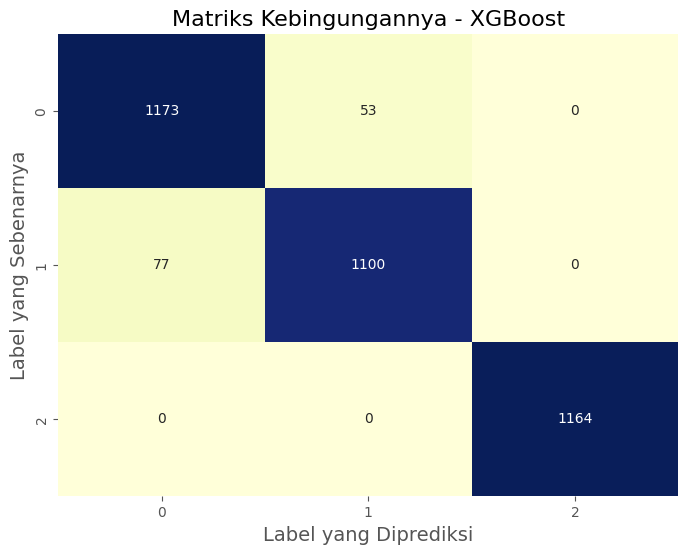

In [87]:
# Label Encoding untuk XGBoost
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)

# Pelatihan XGBoost
model_xgb = XGBClassifier(n_estimators=100, random_state=42, use_label_encoder=False, eval_metric="mlogloss")
model_xgb.fit(X_train, y_train_encoded)

# Prediksi
y_pred_xgb_encoded = model_xgb.predict(X_test)
y_pred_xgb = le.inverse_transform(y_pred_xgb_encoded)

# Evaluasi
akurasi_xgb = accuracy_score(y_test, y_pred_xgb)
laporan_klasifikasi_xgb = classification_report(y_test, y_pred_xgb, output_dict=True)
matriks_kebingungannya_xgb = confusion_matrix(y_test, y_pred_xgb)

# ------------------ Visualisasi ------------------

# 1. Cetak Akurasi
print(f"\n🔹 Akurasi Model XGBoost: {akurasi_xgb:.4f}")

# 2. Tampilkan Laporan Klasifikasi dengan format yang rapi
df_laporan_klasifikasi_xgb = pd.DataFrame(laporan_klasifikasi_xgb).transpose()
print("\n🔹 Laporan Klasifikasi:")
display(df_laporan_klasifikasi_xgb.style.background_gradient(cmap='YlGnBu').format(precision=2))

# 3. Plot Confusion Matrix
plt.figure(figsize=(8,6))
sns.heatmap(matriks_kebingungannya_xgb, annot=True, fmt='d', cmap='YlGnBu', cbar=False)
plt.title('Matriks Kebingungannya - XGBoost', fontsize=16)
plt.xlabel('Label yang Diprediksi', fontsize=14)
plt.ylabel('Label yang Sebenarnya', fontsize=14)
plt.show()


# 7. MELAKUKAN HYPERPARAMETER TUNING

🔹 Akurasi Model Random Forest: 0.9756
🔹 Akurasi Model XGBoost: 0.9636

🔹 Laporan Klasifikasi - Random Forest:


,precision,recall,f1-score,support
1,0.95,0.98,0.97,1226.00
2,0.98,0.94,0.96,1177.00
3,1.00,1.00,1.00,1164.00
accuracy,0.98,0.98,0.98,0.98
macro avg,0.98,0.98,0.98,3567.00
weighted avg,0.98,0.98,0.98,3567.00



🔹 Laporan Klasifikasi - XGBoost:


,precision,recall,f1-score,support
1,0.94,0.96,0.95,1226.00
2,0.95,0.93,0.94,1177.00
3,1.00,1.00,1.00,1164.00
accuracy,0.96,0.96,0.96,0.96
macro avg,0.96,0.96,0.96,3567.00
weighted avg,0.96,0.96,0.96,3567.00


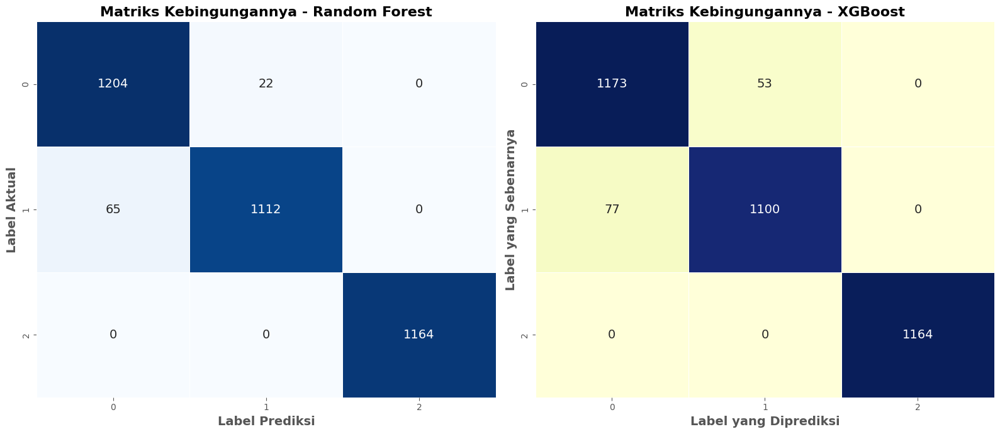

In [88]:


# 1. Definisi Fitur dan Target
fitur = [
    "Tipe_Tabrakan", "Klasifikasi_Fungsi_Jalan", "Kelas_Jalan", "Status_Administratif_Jalan",
    "Jenis_Kawasan", "Jam_Kejadian", "Bentuk_Jalan", "Jenis_Gangguan_Jalan", "Jumlah_Sepeda_Motor", 
    "Jumlah_Mobil_Penumpang", "Jumlah_Mobil_Bus", "Jumlah_Mobil_Barang", "_Kendaraan_Khusus", 
    "Jumlah_tidak_bermotor", "Meninggal_Dunia", "Luka_Berat", "Luka_Ringan", "Tidak_Luka", "Kondisi_Cuaca"
]
target = "Tingkat_Keparahan_Kecelakaan"

# 2. Split Data Latih & Uji
X = df_resampled[fitur]
y = df_resampled[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 3. Melatih Model Random Forest
model_rf = RandomForestClassifier(n_estimators=100, random_state=42)
model_rf.fit(X_train, y_train)

# 4. Prediksi dan Evaluasi Model Random Forest
y_pred_rf = model_rf.predict(X_test)
akurasi_rf = accuracy_score(y_test, y_pred_rf)
laporan_klasifikasi_rf = classification_report(y_test, y_pred_rf, output_dict=True)
matriks_kebingungannya_rf = confusion_matrix(y_test, y_pred_rf)

# 5. Melatih Model XGBoost
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_test_encoded = le.transform(y_test)
model_xgb = XGBClassifier(n_estimators=100, random_state=42, use_label_encoder=False, eval_metric="mlogloss")
model_xgb.fit(X_train, y_train_encoded)

# 6. Prediksi dan Evaluasi Model XGBoost
y_pred_xgb_encoded = model_xgb.predict(X_test)
y_pred_xgb = le.inverse_transform(y_pred_xgb_encoded)
akurasi_xgb = accuracy_score(y_test, y_pred_xgb)
laporan_klasifikasi_xgb = classification_report(y_test, y_pred_xgb, output_dict=True)
matriks_kebingungannya_xgb = confusion_matrix(y_test, y_pred_xgb)

# ------------------ Tampilkan Hasil Evaluasi ------------------

# Akurasi
print(f"🔹 Akurasi Model Random Forest: {akurasi_rf:.4f}")
print(f"🔹 Akurasi Model XGBoost: {akurasi_xgb:.4f}")

# ------------------ Visualisasi Laporan Klasifikasi ------------------

# Membuat DataFrame untuk laporan klasifikasi
df_rf = pd.DataFrame(laporan_klasifikasi_rf).transpose()
df_xgb = pd.DataFrame(laporan_klasifikasi_xgb).transpose()

# Laporan Klasifikasi - Random Forest dengan Background Gradient
print("\n🔹 Laporan Klasifikasi - Random Forest:")
display(df_rf.style.background_gradient(cmap='Blues').format(precision=2))

# Laporan Klasifikasi - XGBoost dengan Background Gradient
print("\n🔹 Laporan Klasifikasi - XGBoost:")
display(df_xgb.style.background_gradient(cmap='YlGnBu').format(precision=2))

# ------------------ Matriks Kebingungannya Bersebelahan ------------------

# Matriks Kebingungannya - Random Forest dan XGBoost berdampingan
fig, axes = plt.subplots(1, 2, figsize=(16,7))

# Matriks Kebingungannya - Random Forest
sns.heatmap(matriks_kebingungannya_rf, annot=True, fmt='d', cmap='Blues', cbar=False, ax=axes[0], annot_kws={"size": 14}, linewidths=0.5)
axes[0].set_title('Matriks Kebingungannya - Random Forest', fontsize=16, fontweight='bold')
axes[0].set_xlabel('Label Prediksi', fontsize=14, fontweight='bold')
axes[0].set_ylabel('Label Aktual', fontsize=14, fontweight='bold')

# Matriks Kebingungannya - XGBoost
sns.heatmap(matriks_kebingungannya_xgb, annot=True, fmt='d', cmap='YlGnBu', cbar=False, ax=axes[1], annot_kws={"size": 14}, linewidths=0.5)
axes[1].set_title('Matriks Kebingungannya - XGBoost', fontsize=16, fontweight='bold')
axes[1].set_xlabel('Label yang Diprediksi', fontsize=14, fontweight='bold')
axes[1].set_ylabel('Label yang Sebenarnya', fontsize=14, fontweight='bold')

# Meningkatkan layout untuk desain yang lebih rapi
plt.tight_layout()

# Menampilkan grafik
plt.show()


# 8. MEMBANGUN MODEL CLUSTERING K MEANS

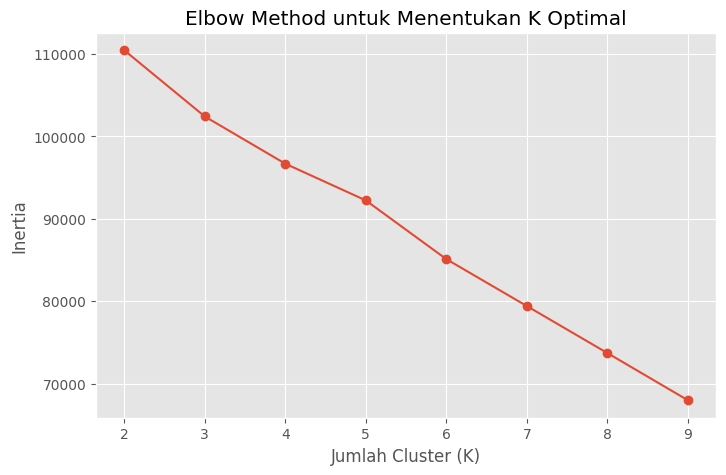

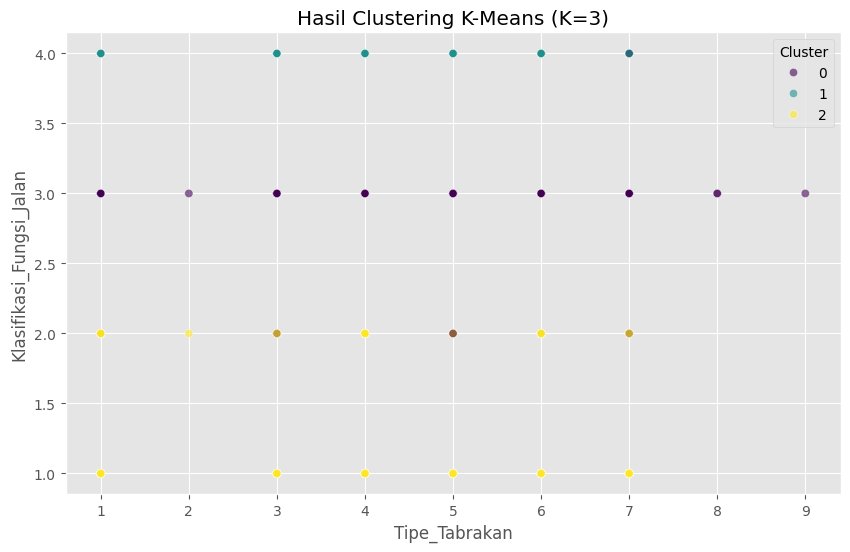

,Tingkat_Keparahan_Kecelakaan,Tipe_Tabrakan,Klasifikasi_Fungsi_Jalan,Kelas_Jalan,Status_Administratif_Jalan,Jenis_Kawasan,Jam_Kejadian,Bentuk_Jalan,Jenis_Gangguan_Jalan,Jumlah_Sepeda_Motor,...,Jumlah_Mobil_Bus,Jumlah_Mobil_Barang,_Kendaraan_Khusus,Jumlah_tidak_bermotor,Meninggal_Dunia,Luka_Berat,Luka_Ringan,Tidak_Luka,Kondisi_Cuaca,Cluster
0,1,2,2,1,2,1,5,1,3,2,...,1,1,1,1,1,1,1,1,3,2
1,2,5,3,4,3,1,4,1,3,3,...,1,1,1,1,3,1,5,3,1,0
2,1,5,2,1,3,1,5,1,3,2,...,1,1,1,1,1,1,4,1,1,2
3,2,1,4,4,3,1,6,1,3,2,...,1,1,1,1,2,1,1,2,1,0
4,2,5,3,3,3,1,7,1,4,2,...,1,1,1,2,1,1,2,1,1,0


In [89]:
#8.MEMBANGUN MODEL CLUSTERING KMEANS
# Pastikan df_all sudah ada dan berisi data lengkap
# Tentukan fitur yang digunakan untuk clustering
fitur_clustering = [
    "Tipe_Tabrakan", "Klasifikasi_Fungsi_Jalan", "Kelas_Jalan", "Status_Administratif_Jalan",
    "Jenis_Kawasan", "Jam_Kejadian", "Bentuk_Jalan", "Jenis_Gangguan_Jalan", "Jumlah_Sepeda_Motor",
    "Jumlah_Mobil_Penumpang", "Jumlah_Mobil_Bus", "Jumlah_Mobil_Barang", "_Kendaraan_Khusus",
    "Jumlah_tidak_bermotor", "Meninggal_Dunia", "Luka_Berat", "Luka_Ringan", "Tidak_Luka", "Kondisi_Cuaca"
]

# Ambil data dari df_all
X_clustering = df_all[fitur_clustering]

# Standarisasi fitur
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_clustering)

# Elbow Method untuk menentukan jumlah cluster optimal
inertia = []
k_range = range(2, 10)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

# Plot Elbow
plt.figure(figsize=(8, 5))
plt.plot(k_range, inertia, marker="o", linestyle="-")
plt.xlabel("Jumlah Cluster (K)")
plt.ylabel("Inertia")
plt.title("Elbow Method untuk Menentukan K Optimal")
plt.show()

# Buat dan latih model KMeans dengan K=4
optimal_k = 3
kmeans_final = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df_all["Cluster"] = kmeans_final.fit_predict(X_scaled)

# Visualisasi hasil clustering (gunakan dua fitur utama, misalnya fitur pertama dan kedua)
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=df_all[fitur_clustering[0]],
    y=df_all[fitur_clustering[1]],
    hue=df_all["Cluster"],
    palette="viridis",
    alpha=0.6
)
plt.title(f"Hasil Clustering K-Means (K={optimal_k})")
plt.xlabel(fitur_clustering[0])
plt.ylabel(fitur_clustering[1])
plt.legend(title="Cluster")
plt.show()

# Tampilkan beberapa data pertama
df_all.head()


# 9. MEMBUAT PETA RESIKO KECELAKAAN

Total data: 6422
NaN Latitude: 2
NaN Longitude: 2
Data setelah filter koordinat valid: 6321
GeoDataFrame info:
<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 6321 entries, 0 to 6421
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Koordinat      6321 non-null   object  
 1   Latitude_DMS   6321 non-null   object  
 2   Longitude_DMS  6321 non-null   object  
 3   Latitude       6321 non-null   float64 
 4   Longitude      6321 non-null   float64 
 5   geometry       6321 non-null   geometry
dtypes: float64(2), geometry(1), object(3)
memory usage: 345.7+ KB
Kolom 'Cluster' tidak ditemukan. Plot tanpa warna cluster.


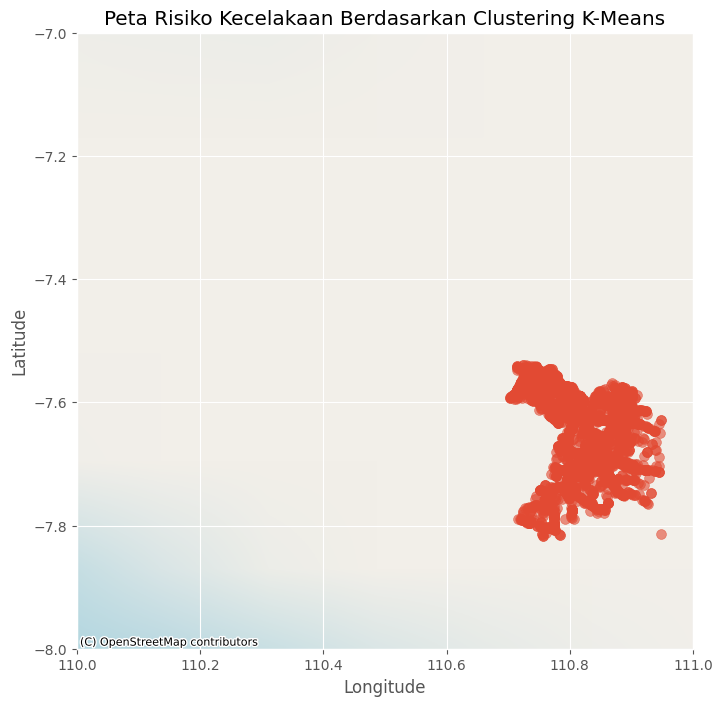

In [90]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
import pandas as pd
import re

# Fungsi konversi DMS ke decimal
def dms_to_decimal(dms_str):
    try:
        dms_str = str(dms_str).strip()
        pattern = r"(\d+)°(\d+)'([\d,\.]+)\"?([NSEW])"
        match = re.match(pattern, dms_str)
        if not match:
            return None
        deg = int(match.group(1))
        minute = int(match.group(2))
        second = float(match.group(3).replace(',', '.'))
        direction = match.group(4).upper()

        decimal = deg + minute / 60 + second / 3600
        if direction in ['S', 'W']:
            decimal = -decimal
        return decimal
    except Exception:
        return None

# Baca data dari Excel
df_peta = pd.read_excel("D:/aku/SEMESTER 7/PROPOSAL/data lang lot/data_lat_negatif.xlsx")

# Konversi kolom Latitude_DMS dan Longitude_DMS ke desimal
df_peta['Latitude'] = df_peta['Latitude_DMS'].apply(dms_to_decimal)
df_peta['Longitude'] = df_peta['Longitude_DMS'].apply(dms_to_decimal)

# Cek dan tampilkan jumlah NaN koordinat
print("Total data:", len(df_peta))
print("NaN Latitude:", df_peta['Latitude'].isna().sum())
print("NaN Longitude:", df_peta['Longitude'].isna().sum())

# Buang baris yang NaN di Latitude atau Longitude
df_peta_clean = df_peta.dropna(subset=['Latitude', 'Longitude']).copy()

# Filter koordinat valid (lintang -90 sampai 90, bujur -180 sampai 180)
df_peta_clean = df_peta_clean[
    df_peta_clean['Latitude'].between(-90, 90) & df_peta_clean['Longitude'].between(-180, 180)
].copy()

print("Data setelah filter koordinat valid:", len(df_peta_clean))

# Buat GeoDataFrame
gdf = gpd.GeoDataFrame(
    df_peta_clean,
    geometry=gpd.points_from_xy(df_peta_clean['Longitude'], df_peta_clean['Latitude']),
    crs="EPSG:4326"
)

# Cek data GeoDataFrame
print("GeoDataFrame info:")
gdf.info()

# Plot peta
fig, ax = plt.subplots(figsize=(10, 8))

# Ganti markersize agar lebih besar
if 'Cluster' in gdf.columns:
    gdf.plot(column='Cluster', cmap='viridis', alpha=0.6, legend=True, ax=ax, markersize=50)
else:
    print("Kolom 'Cluster' tidak ditemukan. Plot tanpa warna cluster.")
    gdf.plot(ax=ax, alpha=0.6, markersize=50)

# Menambahkan basemap dari OpenStreetMap
ctx.add_basemap(ax, crs=gdf.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

# Atur batas peta jika diperlukan
# Misalnya: Fokus pada area Jawa Timur
ax.set_xlim([110, 111])  # Batas Longitude
ax.set_ylim([-8, -7])    # Batas Latitude

# Periksa validitas data sebelum mengatur aspek
if not gdf.empty:
    ax.set_aspect('equal')

plt.title("Peta Risiko Kecelakaan Berdasarkan Clustering K-Means")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()


In [91]:

# 2. Hapus baris dengan missing value di kolom Latitude/Longitude
df_peta = df_peta.dropna(subset=['Latitude', 'Longitude'])

# 3. Ambil fitur untuk clustering (di sini hanya Latitude dan Longitude)
fitur_clustering = ['Latitude', 'Longitude']
X = df_peta[fitur_clustering]

# 4. Standarisasi data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 5. Jalankan KMeans clustering
optimal_k = 3  # Jumlah cluster (bisa kamu tentukan dari Elbow Method sebelumnya)
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df_peta['Cluster'] = kmeans.fit_predict(X_scaled)

# 6. Buat GeoDataFrame untuk keperluan visualisasi
gdf = gpd.GeoDataFrame(
    df_peta,
    geometry=gpd.points_from_xy(df_peta['Longitude'], df_peta['Latitude']),
    crs='EPSG:4326'
)

# 7. Buat peta interaktif dengan folium
peta = folium.Map(location=[df_peta['Latitude'].mean(), df_peta['Longitude'].mean()], zoom_start=11)
marker_cluster = MarkerCluster().add_to(peta)

# Warna untuk setiap cluster
colors = ['green', 'orange', 'red']  # Sesuaikan jumlah warna dengan jumlah cluster

# Tambahkan titik ke peta
for _, row in gdf.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=6,
        color=colors[row['Cluster']],
        fill=True,
        fill_color=colors[row['Cluster']],
        fill_opacity=0.7,
        popup=f"Cluster: {row['Cluster']}"
    ).add_to(marker_cluster)

# 8. Simpan peta ke file HTML
peta.save('D:/Peta_Kecelakaan/peta_risiko_kecelakaan.html')
print("✅ Peta berhasil dibuat dan disimpan ke 'peta_risiko_kecelakaan.html'")


✅ Peta berhasil dibuat dan disimpan ke 'peta_risiko_kecelakaan.html'


In [92]:


# Inisiasi peta tanpa membutuhkan kolom 'Cluster'
peta = folium.Map(location=[df_peta_clean['Latitude'].mean(), df_peta_clean['Longitude'].mean()], zoom_start=11)

# Tambahkan MarkerCluster
marker_cluster = MarkerCluster().add_to(peta)

# Menambahkan marker tanpa Cluster
for idx, row in df_peta_clean.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=6,
        color='blue',  # Menggunakan warna statis
        fill=True,
        fill_color='blue',  # Warna statis
        fill_opacity=0.7,
        popup=f"Latitude: {row['Latitude']}, Longitude: {row['Longitude']}"  # Menampilkan lat, lon pada popup
    ).add_to(marker_cluster)

# Menambahkan Google Maps sebagai latar belakang
folium.TileLayer('cartodb positron').add_to(peta)  # Ganti dengan layer yang sesuai, misalnya Google Maps

# Simpan peta ke file HTML
peta.save('peta_risiko_kecelakaan_no_cluster.html')
print("✅ Peta berhasil dibuat dan disimpan ke 'peta_risiko_kecelakaan_no_cluster.html'")

# Tampilkan peta
peta


✅ Peta berhasil dibuat dan disimpan ke 'peta_risiko_kecelakaan_no_cluster.html'


# CLUSTERING MENGGUNAKAN KMEANS


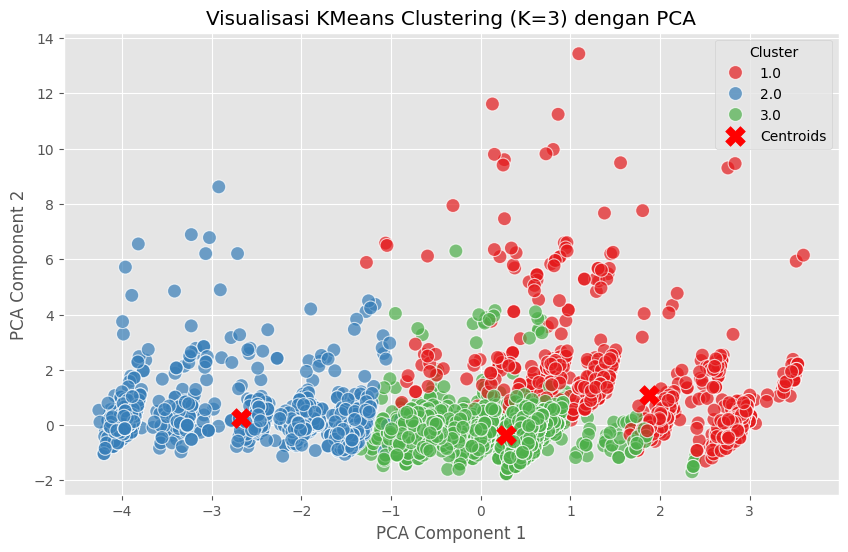

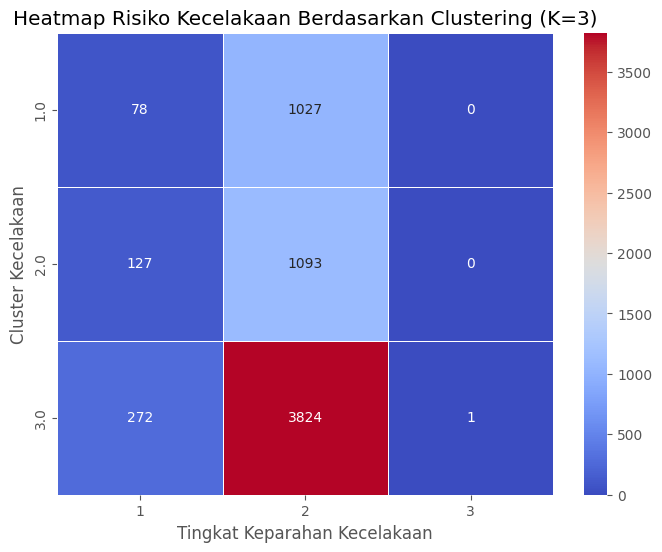

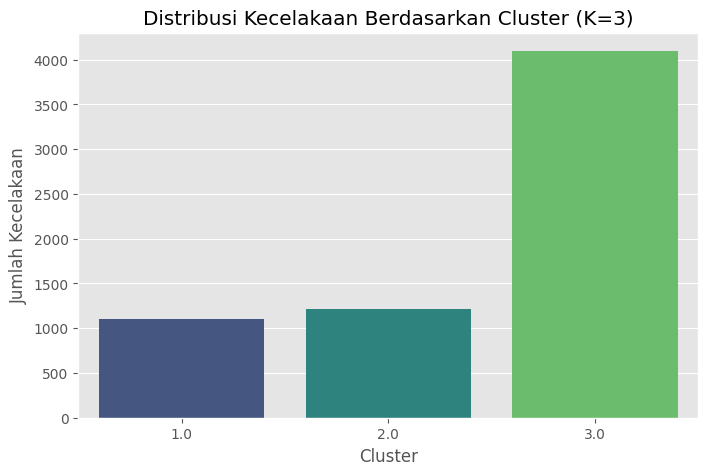

In [93]:
# Import libraries

# 1. Load cleaned dataset
file_path = r"D:\aku\SEMESTER 7\PROPOSAL\data laka dicoding\csv dikoding baru\output_pisah\gabungan_data.csv"
df_combined_cleaned = pd.read_csv(file_path)

# 2. Fitur yang digunakan untuk clustering
features = [
    "Tipe_Tabrakan", "Klasifikasi_Fungsi_Jalan", "Kelas_Jalan",
    "Status_Administratif_Jalan", "Jenis_Kawasan", "Jam_Kejadian",
    "Bentuk_Jalan", "Jenis_Gangguan_Jalan", "Kondisi_Cuaca"
]

# 3. Filter data (hapus baris yang memiliki nilai NaN pada fitur clustering)
df_filtered = df_combined_cleaned.dropna(subset=features)

# 4. Pisahkan fitur kategorikal dan numerik
fitur_kategorikal = df_filtered[features].select_dtypes(include="object").columns.tolist()
fitur_numerik = [f for f in features if f not in fitur_kategorikal]

# 5. One-hot encoding untuk fitur kategorikal
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
X_encoded = encoder.fit_transform(df_filtered[fitur_kategorikal])

# 6. Ambil fitur numerik (jika ada)
X_numerik = df_filtered[fitur_numerik].values if fitur_numerik else np.empty((len(df_filtered), 0))

# 7. Gabungkan encoded + numerik
X_all = np.hstack([X_encoded, X_numerik])

# 8. Standarisasi fitur
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_all)

# 9. Clustering dengan KMeans (K=3)
optimal_k = 3
kmeans_final = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df_filtered["Cluster"] = kmeans_final.fit_predict(X_scaled) + 1

# 10. Gabungkan hasil cluster ke df_combined_cleaned
df_combined_cleaned.loc[df_filtered.index, "Cluster"] = df_filtered["Cluster"]

# 11. Reduksi dimensi menggunakan PCA untuk memvisualisasikan dalam 2D
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# 12. Visualisasi: Scatter plot dengan persebaran berdasarkan cluster
plt.figure(figsize=(10, 6))

# Plot data berdasarkan cluster
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=df_combined_cleaned["Cluster"],
                palette="Set1", s=100, alpha=0.7, edgecolor='w', legend='full')

# Tambahkan centroid ke plot
centroids_pca = pca.transform(kmeans_final.cluster_centers_)
plt.scatter(centroids_pca[:, 0], centroids_pca[:, 1], c='red', s=200, marker='X', label="Centroids")

# Tambahkan label dan judul
plt.title("Visualisasi KMeans Clustering (K=3) dengan PCA")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend(title="Cluster", loc='upper right')
plt.show()

# 13. Visualisasi: Heatmap Risiko Kecelakaan
plt.figure(figsize=(8, 6))
heatmap_data = pd.crosstab(df_combined_cleaned["Cluster"], df_combined_cleaned["Tingkat_Keparahan_Kecelakaan"])
sns.heatmap(heatmap_data, annot=True, cmap="coolwarm", fmt="d", linewidths=0.5)
plt.title("Heatmap Risiko Kecelakaan Berdasarkan Clustering (K=3)")
plt.xlabel("Tingkat Keparahan Kecelakaan")
plt.ylabel("Cluster Kecelakaan")
plt.show()

# 14. Visualisasi: Distribusi Jumlah Kecelakaan per Cluster
plt.figure(figsize=(8, 5))
sns.countplot(x=df_combined_cleaned["Cluster"], palette="viridis")
plt.title("Distribusi Kecelakaan Berdasarkan Cluster (K=3)")
plt.xlabel("Cluster")
plt.ylabel("Jumlah Kecelakaan")
plt.show()


# CLUSTERING MENGGUNAKAN DBSCAN

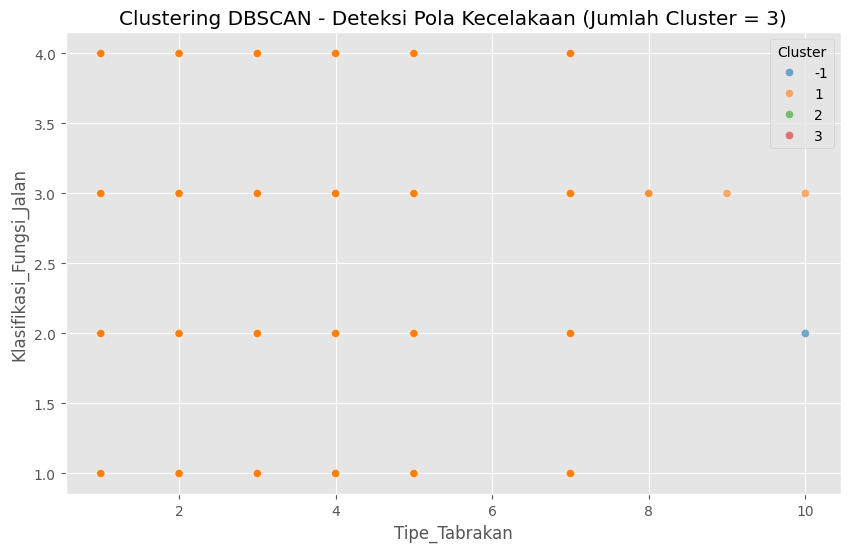

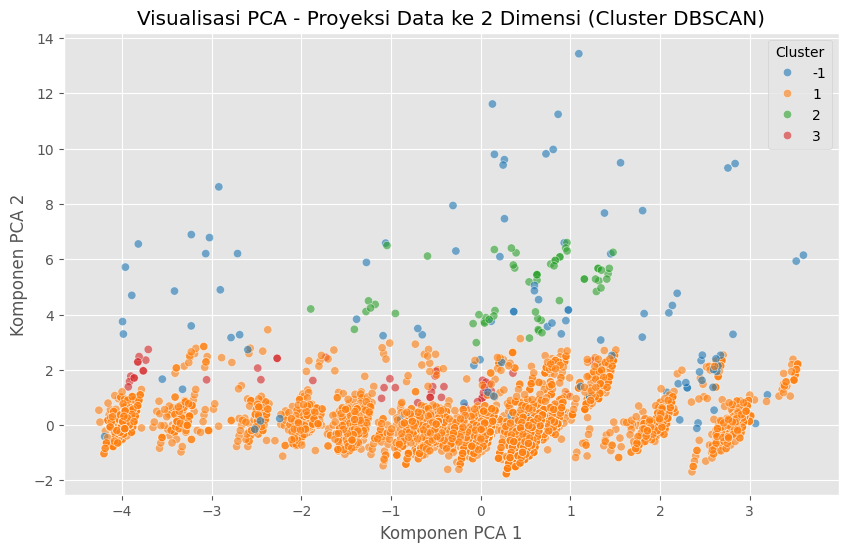

Jumlah Anggota dalam Setiap Klaster:
DBSCAN_Cluster
-1     107
 1    6208
 2      58
 3      49
Name: count, dtype: int64
Silhouette Score (tanpa noise): 0.5281


In [94]:
# Memuat dataset yang sudah dibersihkan
file_path = r"D:\aku\SEMESTER 7\PROPOSAL\data laka dicoding\csv dikoding baru\output_pisah\gabungan_data.csv"
df_combined_cleaned = pd.read_csv(file_path)

# Memilih fitur untuk klasterisasi
fitur = [
    "Tipe_Tabrakan", "Klasifikasi_Fungsi_Jalan", "Kelas_Jalan",
    "Status_Administratif_Jalan", "Jenis_Kawasan", "Jam_Kejadian",
    "Bentuk_Jalan", "Jenis_Gangguan_Jalan", "Kondisi_Cuaca"
]

# Melakukan standarisasi data untuk DBSCAN
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_combined_cleaned[fitur])

# Menerapkan klasterisasi DBSCAN
dbscan_model = DBSCAN(eps=2, min_samples=10)
df_combined_cleaned["DBSCAN_Cluster"] = dbscan_model.fit_predict(X_scaled)

# Ubah label cluster agar dimulai dari 1, dan -1 tetap sebagai noise
cluster_mapping = {
    old: (i + 1) for i, old in enumerate(sorted(c for c in set(df_combined_cleaned["DBSCAN_Cluster"]) if c != -1))
}
df_combined_cleaned["DBSCAN_Cluster"] = df_combined_cleaned["DBSCAN_Cluster"].map(lambda x: cluster_mapping[x] if x != -1 else -1)

# Menghitung jumlah cluster yang ditemukan (mengabaikan poin noise)
jumlah_cluster = len(cluster_mapping)

# Visualisasi hasil klasterisasi DBSCAN (menggunakan fitur asli tanpa PCA)
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df_combined_cleaned[fitur[0]],  
                y=df_combined_cleaned[fitur[1]],  
                hue=df_combined_cleaned["DBSCAN_Cluster"], palette="tab10", alpha=0.6)
plt.title(f"Clustering DBSCAN - Deteksi Pola Kecelakaan (Jumlah Cluster = {jumlah_cluster})")
plt.xlabel(fitur[0])
plt.ylabel(fitur[1])
plt.legend(title="Cluster")
plt.show()

# Menerapkan PCA untuk proyeksi 2 dimensi
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)
df_combined_cleaned["PCA_1"] = X_pca[:, 0]
df_combined_cleaned["PCA_2"] = X_pca[:, 1]

# Visualisasi hasil PCA
plt.figure(figsize=(10, 6))
sns.scatterplot(x="PCA_1", y="PCA_2", hue="DBSCAN_Cluster", data=df_combined_cleaned, palette="tab10", alpha=0.6)
plt.title("Visualisasi PCA - Proyeksi Data ke 2 Dimensi (Cluster DBSCAN)")
plt.xlabel("Komponen PCA 1")
plt.ylabel("Komponen PCA 2")
plt.legend(title="Cluster")
plt.show()

# Menghitung jumlah anggota di setiap klaster
cluster_counts = df_combined_cleaned["DBSCAN_Cluster"].value_counts().sort_index()
print("Jumlah Anggota dalam Setiap Klaster:")
print(cluster_counts)

# Ambil hasil cluster DBSCAN
labels = df_combined_cleaned["DBSCAN_Cluster"].values

# Silahkan hitung Silhouette Score hanya jika ada minimal 2 cluster yang terbentuk (tidak termasuk noise)
# DBSCAN menggunakan label -1 untuk noise, jadi kita harus mengabaikan noise saat hitung silhouette
# Silhouette score harus dilakukan pada data yang tidak termasuk noise

# Filter data dan label yang bukan noise (-1)
mask = labels != -1
if len(set(labels[mask])) > 1:
    score = silhouette_score(X_scaled[mask], labels[mask])
    print(f"Silhouette Score (tanpa noise): {score:.4f}")
else:
    print("Silhouette Score tidak dapat dihitung karena hanya ada 1 cluster (atau kurang) selain noise.")



# PERBANDINGAN DBSCAN DAN KMEANS

,Metode Clustering,Jumlah Cluster,Poin Noise (DBSCAN hanya)
0,K-Means,3,N/A
1,DBSCAN,3,107


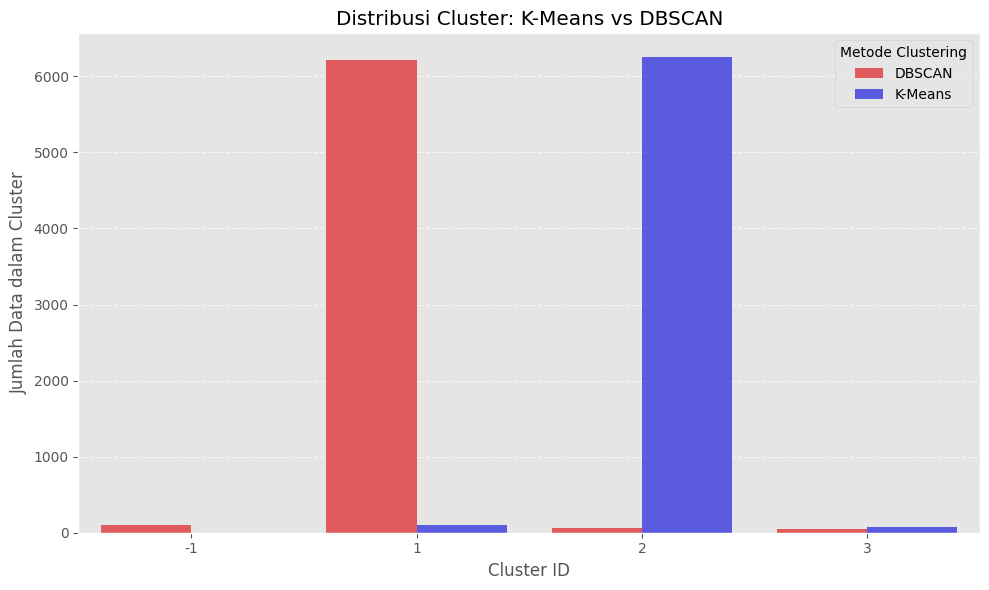

,Metode Clustering,Silhouette Score
0,K-Means,0.59
1,DBSCAN,0.53


K-Means: Jumlah Cluster = 3, Silhouette Score = 0.5853
DBSCAN: Jumlah Cluster = 3, Poin Noise = 107, Silhouette Score = 0.5281


In [95]:
#==============================
#PERBANDINGAN DBSCAN DAN KMEANS
#==============================

# Baca data gabungan yang sudah dibersihkan
df_combined_cleaned = pd.read_csv(r"D:\aku\SEMESTER 7\PROPOSAL\data laka dicoding\csv dikoding baru\output_pisah\gabungan_data.csv")

# Daftar kolom fitur numerik atau yang sudah diencoding
fitur = ["Tipe_Tabrakan", "Klasifikasi_Fungsi_Jalan", "Kelas_Jalan",
         "Status_Administratif_Jalan", "Jenis_Kawasan", "Jam_Kejadian",
         "Bentuk_Jalan", "Jenis_Gangguan_Jalan", "Kondisi_Cuaca"]

# Standarisasi data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_combined_cleaned[fitur])

# =========================
# K-Means Clustering
# =========================
num_clusters_kmeans = 3
kmeans_model = KMeans(n_clusters=num_clusters_kmeans, random_state=42)
df_combined_cleaned["Cluster"] = kmeans_model.fit_predict(X_scaled)
# Ubah label cluster K-Means agar mulai dari 1
df_combined_cleaned["Cluster"] = df_combined_cleaned["Cluster"] + 1

# =========================
# DBSCAN Clustering
# =========================
# Jika belum dijalankan sebelumnya, tambahkan baris ini:
dbscan_model = DBSCAN(eps=2, min_samples=10)
df_combined_cleaned["DBSCAN_Cluster"] = dbscan_model.fit_predict(X_scaled)
# Ubah label cluster DBSCAN agar mulai dari 1, kecuali noise (-1 tetap -1)
df_combined_cleaned["DBSCAN_Cluster"] = df_combined_cleaned["DBSCAN_Cluster"].apply(lambda x: x + 1 if x != -1 else -1)
# Hitung jumlah cluster DBSCAN (tidak termasuk noise -1)
num_clusters_dbscan = len(set(df_combined_cleaned["DBSCAN_Cluster"])) - (1 if -1 in df_combined_cleaned["DBSCAN_Cluster"].values else 0)

# =========================
# Perbandingan jumlah cluster
# =========================
clustering_comparison = pd.DataFrame({
    "Metode Clustering": ["K-Means", "DBSCAN"],
    "Jumlah Cluster": [num_clusters_kmeans, num_clusters_dbscan],
    "Poin Noise (DBSCAN hanya)": ["N/A", (df_combined_cleaned["DBSCAN_Cluster"] == -1).sum()]
})
display(clustering_comparison)

# =========================
# Visualisasi distribusi cluster
# =========================
plt.figure(figsize=(10, 6))
# MENGGUNAKAN COUNTPLOT UNTUK TAMPILAN YANG LEBIH AKURAT DAN JELAS
plot_df_kmeans = pd.DataFrame({'Cluster ID': df_combined_cleaned['Cluster'], 'Metode': 'K-Means'})
plot_df_dbscan = pd.DataFrame({'Cluster ID': df_combined_cleaned['DBSCAN_Cluster'], 'Metode': 'DBSCAN'})
plot_df_combined = pd.concat([plot_df_kmeans, plot_df_dbscan])

sns.countplot(data=plot_df_combined, x='Cluster ID', hue='Metode',
              palette={'K-Means': 'blue', 'DBSCAN': 'red'}, alpha=0.7)

plt.title("Distribusi Cluster: K-Means vs DBSCAN")
plt.xlabel("Cluster ID")
plt.ylabel("Jumlah Data dalam Cluster")
plt.legend(title="Metode Clustering")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# =========================
# Silhouette Score
# =========================
# Filter data dan label untuk DBSCAN yang bukan noise (-1)
# PENTING: Gunakan X_scaled yang sesuai dengan baris yang bukan noise
mask_no_noise_dbscan = df_combined_cleaned["DBSCAN_Cluster"] != -1
X_scaled_no_noise_dbscan = X_scaled[mask_no_noise_dbscan]
labels_no_noise_dbscan = df_combined_cleaned["DBSCAN_Cluster"][mask_no_noise_dbscan]
silhouette_kmeans = silhouette_score(X_scaled, df_combined_cleaned["Cluster"])

# Pastikan ada setidaknya 2 klaster yang valid (selain noise) untuk menghitung Silhouette Score DBSCAN
if len(set(labels_no_noise_dbscan)) > 1:
    silhouette_dbscan = silhouette_score(X_scaled_no_noise_dbscan, labels_no_noise_dbscan)
else:
    silhouette_dbscan = "Tidak dapat dihitung (kurang dari 2 klaster valid selain noise)"

silhouette_comparison = pd.DataFrame({
    "Metode Clustering": ["K-Means", "DBSCAN"],
    "Silhouette Score": [silhouette_kmeans, silhouette_dbscan]
})
display(silhouette_comparison)


# =========================
# Hasil akhir
# =========================
print(f"K-Means: Jumlah Cluster = {num_clusters_kmeans}, Silhouette Score = {silhouette_kmeans:.4f}")
print(f"DBSCAN: Jumlah Cluster = {num_clusters_dbscan}, Poin Noise = {(df_combined_cleaned['DBSCAN_Cluster'] == -1).sum()}, Silhouette Score = {silhouette_dbscan:.4f}")

In [96]:


# Path ke file CSV gabungan
file_path_cleaned = r"D:\aku\SEMESTER 7\PROPOSAL\data laka dicoding\csv dikoding baru\output_pisah\gabungan_data.csv"

# Baca file CSV gabungan
df_combined_cleaned = pd.read_csv(file_path_cleaned)

# Cek dan buat cluster jika belum ada
if "Cluster" not in df_combined_cleaned.columns:
    features = [
        "Tipe_Tabrakan", "Klasifikasi_Fungsi_Jalan", "Kelas_Jalan",
        "Status_Administratif_Jalan", "Jenis_Kawasan", "Jam_Kejadian",
        "Bentuk_Jalan", "Jenis_Gangguan_Jalan", "Kondisi_Cuaca"
    ]

    # Standardisasi
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(df_combined_cleaned[features])

    # Clustering dengan KMeans
    optimal_k = 3
    kmeans_final = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
    df_combined_cleaned["Cluster"] = kmeans_final.fit_predict(X_scaled)

# Analisis karakteristik cluster
cluster_summary = df_combined_cleaned.groupby("Cluster").agg({
    "Tingkat_Keparahan_Kecelakaan": "mean",
    "Tipe_Tabrakan": "median",
    "Klasifikasi_Fungsi_Jalan": "median",
    "Bentuk_Jalan": "median",
    "Jenis_Gangguan_Jalan": "median",
    "Kondisi_Cuaca": "median",
    "Jam_Kejadian": "median"
}).reset_index()

# Tampilkan summary (jika tidak menggunakan ace_tools, bisa gunakan print atau display)
try:
    import ace_tools as tools
    tools.display_dataframe_to_user(name="Ringkasan Karakteristik Cluster untuk Kebijakan", dataframe=cluster_summary)
except:
    print(cluster_summary)

# Buat rekomendasi kebijakan
recommendations = []

for index, row in cluster_summary.iterrows():
    cluster_id = row["Cluster"]
    severe_accidents = row["Tingkat_Keparahan_Kecelakaan"]
    road_type = row["Klasifikasi_Fungsi_Jalan"]
    road_shape = row["Bentuk_Jalan"]
    disturbance_type = row["Jenis_Gangguan_Jalan"]
    weather_condition = row["Kondisi_Cuaca"]
    accident_time = row["Jam_Kejadian"]

    recommendation = f"**Cluster {cluster_id}:** "

    if severe_accidents > 1.5:
        recommendation += "Tingkat keparahan kecelakaan tinggi, diperlukan peningkatan keselamatan."

    if disturbance_type == 1:
        recommendation += " Perbaikan jalan diperlukan untuk mengatasi jalan berlubang."

    if road_shape == 3:
        recommendation += " Tambahkan rambu peringatan dan pengendalian kecepatan di tikungan tajam."

    if weather_condition == 2:
        recommendation += " Peningkatan drainase jalan diperlukan untuk mencegah genangan air saat hujan."

    if accident_time in [5, 6]:
        recommendation += " Penambahan penerangan jalan dan patroli lalu lintas di jam rawan kecelakaan."

    recommendations.append(recommendation)

# Tampilkan rekomendasi
for rec in recommendations:
    print(rec)


   Cluster  Tingkat_Keparahan_Kecelakaan  Tipe_Tabrakan  \
0        0                          1.93           2.00   
1        1                          1.90           3.00   
2        2                          1.93           3.00   

   Klasifikasi_Fungsi_Jalan  Bentuk_Jalan  Jenis_Gangguan_Jalan  \
0                      3.00          1.00                  8.00   
1                      2.00          1.00                 11.00   
2                      3.00          1.00                 11.00   

   Kondisi_Cuaca  Jam_Kejadian  
0           1.00          5.00  
1           1.00          4.00  
2           1.00          4.00  
**Cluster 0.0:** Tingkat keparahan kecelakaan tinggi, diperlukan peningkatan keselamatan. Penambahan penerangan jalan dan patroli lalu lintas di jam rawan kecelakaan.
**Cluster 1.0:** Tingkat keparahan kecelakaan tinggi, diperlukan peningkatan keselamatan.
**Cluster 2.0:** Tingkat keparahan kecelakaan tinggi, diperlukan peningkatan keselamatan.


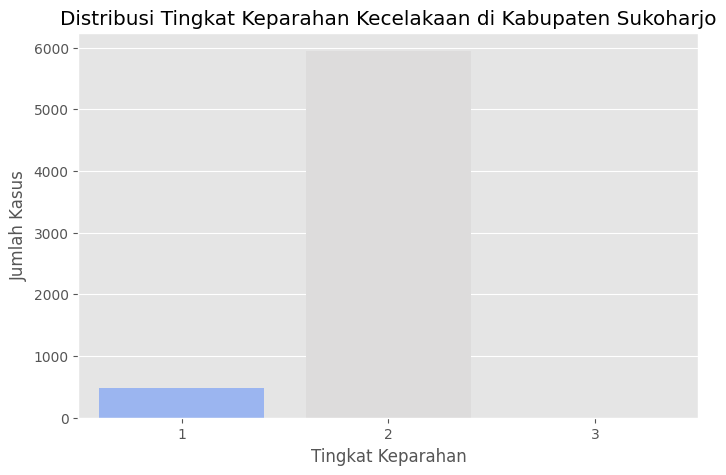

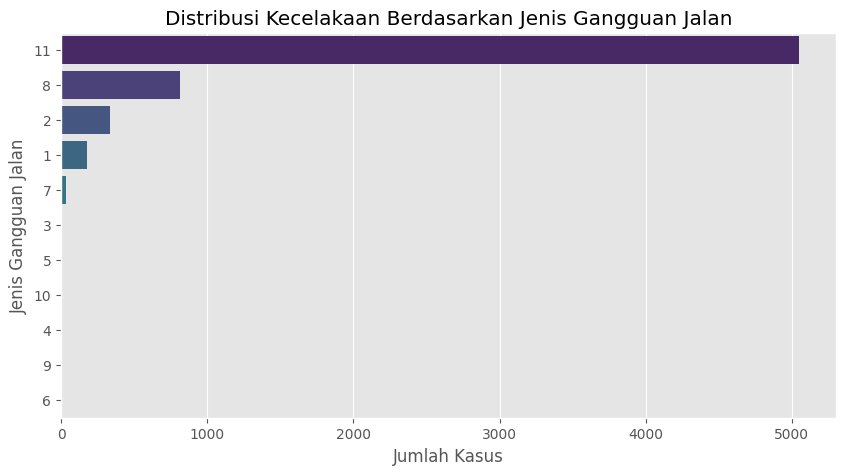

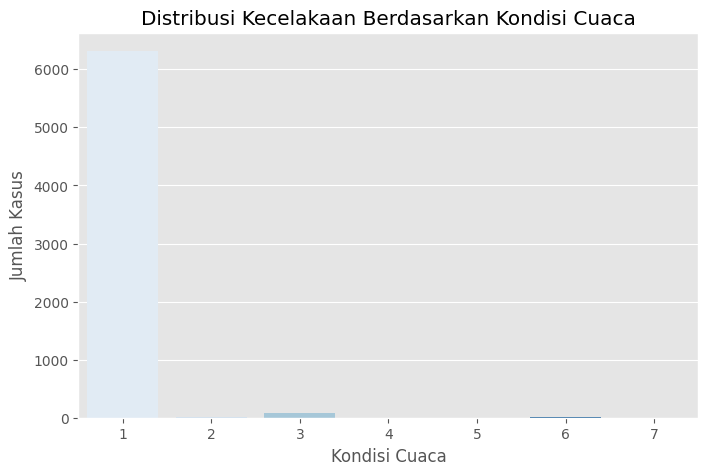

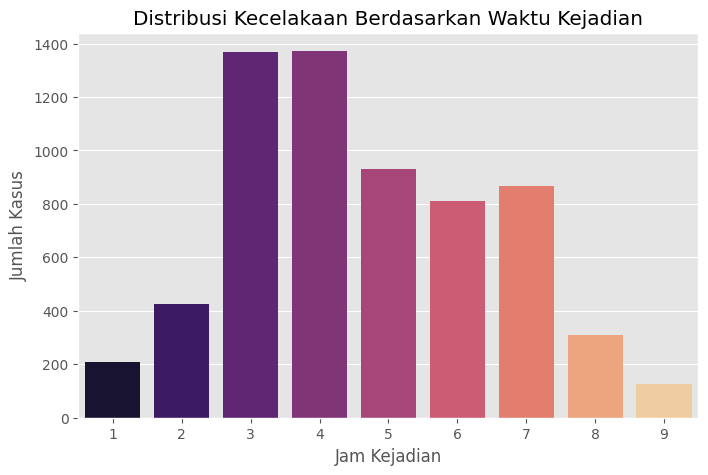

In [97]:
# Re-load the cleaned CSV files as execution state was reset 
 

# Re-load the cleaned dataset 
file_path_cleaned = r"D:\aku\SEMESTER 7\PROPOSAL\data laka dicoding\csv dikoding baru\output_pisah\gabungan_data.csv"

# Read the cleaned CSV file into dataframe 
df_combined_cleaned = pd.read_csv(file_path_cleaned)

# Step 14: Creating Infographic-Style Visualizations for Report 

# 1. Visualizing the distribution of accident severity 
plt.figure(figsize=(8, 5)) 
sns.countplot(x=df_combined_cleaned["Tingkat_Keparahan_Kecelakaan"], palette="coolwarm") 
plt.title("Distribusi Tingkat Keparahan Kecelakaan di Kabupaten Sukoharjo") 
plt.xlabel("Tingkat Keparahan") 
plt.ylabel("Jumlah Kasus") 
plt.show() 

# 2. Visualizing accidents by road condition (Jenis Gangguan Jalan) 
plt.figure(figsize=(10, 5)) 
sns.countplot(y=df_combined_cleaned["Jenis_Gangguan_Jalan"], 
              order=df_combined_cleaned["Jenis_Gangguan_Jalan"].value_counts().index, 
              palette="viridis") 
plt.title("Distribusi Kecelakaan Berdasarkan Jenis Gangguan Jalan") 
plt.xlabel("Jumlah Kasus") 
plt.ylabel("Jenis Gangguan Jalan") 
plt.show() 

# 3. Visualizing accidents by weather conditions 
plt.figure(figsize=(8, 5)) 
sns.countplot(x=df_combined_cleaned["Kondisi_Cuaca"], palette="Blues") 
plt.title("Distribusi Kecelakaan Berdasarkan Kondisi Cuaca") 
plt.xlabel("Kondisi Cuaca") 
plt.ylabel("Jumlah Kasus") 
plt.show() 

# 4. Heatmap for clustering and accident severity 
if "Cluster" in df_combined_cleaned.columns:
    heatmap_data = pd.crosstab(df_combined_cleaned["Cluster"], 
                                df_combined_cleaned["Tingkat_Keparahan_Kecelakaan"]) 
    plt.figure(figsize=(8, 6)) 
    sns.heatmap(heatmap_data, annot=True, cmap="coolwarm", fmt="d", linewidths=0.5) 
    plt.title("Heatmap Risiko Kecelakaan Berdasarkan Clustering di Kabupaten Sukoharjo") 
    plt.xlabel("Tingkat Keparahan Kecelakaan") 
    plt.ylabel("Cluster Kecelakaan") 
    plt.show()

# 5. Distribution of accidents by time of the day 
plt.figure(figsize=(8, 5)) 
sns.countplot(x=df_combined_cleaned["Jam_Kejadian"], palette="magma") 
plt.title("Distribusi Kecelakaan Berdasarkan Waktu Kejadian") 
plt.xlabel("Jam Kejadian") 
plt.ylabel("Jumlah Kasus") 
plt.show()


In [98]:

# Load the cleaned dataset again after reset 
file_paths_cleaned = {
    "2019": r"D:\aku\SEMESTER 7\PROPOSAL\data laka dicoding\csv dikoding baru\dikoding baru 21 april\2019 csv.csv",
    "2020": r"D:\aku\SEMESTER 7\PROPOSAL\data laka dicoding\csv dikoding baru\dikoding baru 21 april\2020 csv.csv",
    "2021": r"D:\aku\SEMESTER 7\PROPOSAL\data laka dicoding\csv dikoding baru\dikoding baru 21 april\2021 csv.csv",
    "2022": r"D:\aku\SEMESTER 7\PROPOSAL\data laka dicoding\csv dikoding baru\dikoding baru 21 april\2022 csv.csv",
    "2023": r"D:\aku\SEMESTER 7\PROPOSAL\data laka dicoding\csv dikoding baru\dikoding baru 21 april\2023 csv.csv"
}

# Read all cleaned CSV files into dataframes 
dataframes_cleaned = {year: pd.read_csv(path) for year, path in file_paths_cleaned.items()}

# Combine all years into one dataset for dashboard 
df_dashboard = pd.concat(dataframes_cleaned.values(), ignore_index=True) 

# Pilih fitur untuk clustering
features = df_dashboard[['Tingkat_Keparahan_Kecelakaan', 'Jenis_Gangguan_Jalan', 'Kondisi_Cuaca']]  # Pilih fitur yang relevan

# Ubah data kategorikal menjadi numerik menggunakan pd.get_dummies (One-Hot Encoding)
features = pd.get_dummies(features)

# Terapkan KMeans (misalnya 3 klaster)
kmeans = KMeans(n_clusters=3, random_state=42)
df_dashboard['Cluster'] = kmeans.fit_predict(features)

# 1. Pie Chart for Accident Severity Distribution
fig_severity = px.pie(df_dashboard, names="Tingkat_Keparahan_Kecelakaan", title="Distribusi Tingkat Keparahan Kecelakaan") 

# 2. Bar Chart for Accident by Road Condition (Jenis Gangguan Jalan)
fig_road_condition = px.bar(df_dashboard, x="Jenis_Gangguan_Jalan", title="Distribusi Kecelakaan Berdasarkan Jenis Gangguan Jalan") 

# 3. Bar Chart for Weather Condition Impact
fig_weather = px.bar(df_dashboard, x="Kondisi_Cuaca", title="Distribusi Kecelakaan Berdasarkan Kondisi Cuaca") 

# 4. Heatmap for Clustering and Severity
heatmap_data = pd.crosstab(df_dashboard["Cluster"], df_dashboard["Tingkat_Keparahan_Kecelakaan"])
fig_heatmap = go.Figure(data=go.Heatmap(z=heatmap_data.values, 
                                        x=heatmap_data.columns, 
                                        y=heatmap_data.index, 
                                        colorscale="reds"))
fig_heatmap.update_layout(title="Heatmap Risiko Kecelakaan Berdasarkan Clustering")

# 5. Line Chart for Accident Time Distribution
fig_time = px.line(df_dashboard.groupby("Jam_Kejadian").size().reset_index(name="Jumlah Kecelakaan"),  
                   x="Jam_Kejadian", y="Jumlah Kecelakaan", 
                   title="Distribusi Kecelakaan Berdasarkan Waktu Kejadian") 

# Display the interactive dashboard
dashboard_figs = { 
    "Pie Chart - Tingkat Keparahan Kecelakaan": fig_severity, 
    "Bar Chart - Jenis Gangguan Jalan": fig_road_condition, 
    "Bar Chart - Kondisi Cuaca": fig_weather, 
    "Heatmap - Risiko Kecelakaan": fig_heatmap, 
    "Line Chart - Waktu Kejadian": fig_time, 
} 

# tools.display_dashboard(name="Dashboard Interaktif Kecelakaan Sukoharjo", figures=dashboard_figs)


In [99]:


# Save dashboard components as an HTML file 
dashboard_html_path = r"D:\aku\SEMESTER 7\PROPOSAL\data laka dicoding\csv dikoding baru\html\Dashboard_Kecelakaan_Sukoharjo.html"  # Use a valid path on your machine

# Creating a single HTML file with all figures 
with open(dashboard_html_path, "w") as f: 
    f.write("<html><head><title>Dashboard Kecelakaan Sukoharjo</title></head><body>") 
    f.write("<h1>Dashboard Interaktif Kecelakaan di Kabupaten Sukoharjo</h1>") 

    for title, fig in dashboard_figs.items(): 
        f.write(f"<h2>{title}</h2>") 
        f.write(pio.to_html(fig, full_html=False, include_plotlyjs="cdn"))

    f.write("</body></html>")  # Closing the HTML body properly

# Provide the download link for the interactive HTML dashboard 
dashboard_html_path


'D:\\aku\\SEMESTER 7\\PROPOSAL\\data laka dicoding\\csv dikoding baru\\html\\Dashboard_Kecelakaan_Sukoharjo.html'